# Importando Bibliotecas e Funções

In [2]:
#permitir auto-complete dos codigos com tab
%config Completer.use_jedi = False

#manipular dados
import pandas as pd
from pandas import json_normalize
import numpy as np
from ast import literal_eval

#requisicoes de API
import requests
import json

#manipular datas
import time
import datetime

#manipular strings
from unidecode import unidecode

#plotar e visualizar
import seaborn as sns
import matplotlib.pyplot as plt

#remover warnings
import warnings
warnings.simplefilter("ignore")
import http.client

#machine learning
from sklearn.model_selection import cross_val_score, cross_validate, GridSearchCV, KFold, learning_curve, train_test_split
from sklearn import feature_selection

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_curve, plot_roc_curve

from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

#funções para resetar e testar modulos
# %load_ext autoreload
# %autoreload 2

#aumentar display de linhas e colunas
pd.set_option('display.max_columns',250)

pd.set_option('display.min_rows',30)
pd.set_option('display.max_rows',30)

In [3]:
#valores a serem informados nas requisições

payload={}

headers = {
  'x-rapidapi-key': 'c58a251d827eeee96ac5cb890e882cc9',
  'x-rapidapi-host': 'v3.football.api-sports.io'
}

In [4]:
  '''
abre um Json até o último nível, trazendo todas as colunas para o nível mais alto, 
no processo, repete alguns valores para as linhas
args:
    df (DataFrame): dataframe contendo colunas em Json
returns:
    df (DataFrame): dataframe contendo todas as informacoes do Json

notes:
    em certos Json com muitas informações, pode ocorrer um MemoryError. Recomenda combinar a função com
    .explode() e json_normalize(record_path = [], meta = []) para melhores resultados
'''
    
def flatten_nested_json_df(df):

    '''
    abre um Json até o último nível, trazendo todas as colunas para o nível mais alto, 
    no processo, repete alguns valores para as linhas
    args:
        df (DataFrame): dataframe contendo colunas em Json
    returns:
        df (DataFrame): dataframe contendo todas as informacoes do Json

    notes:
        em certos Json com muitas informações, pode ocorrer um MemoryError. Recomenda combinar a função com
        .explode() e json_normalize(record_path = [], meta = []) para melhores resultados
    '''

    df = df.reset_index()
    s = (df.applymap(type) == list).all()
    list_columns = s[s].index.tolist()
    s = (df.applymap(type) == dict).all()
    dict_columns = s[s].index.tolist()
    while len(list_columns) > 0 or len(dict_columns) > 0:
        new_columns = []
        for col in dict_columns:
            horiz_exploded = pd.json_normalize(df[col]).add_prefix(f'{col}.')
            horiz_exploded.index = df.index
            df = pd.concat([df, horiz_exploded], axis=1).drop(columns=[col])
            new_columns.extend(horiz_exploded.columns)
        for col in list_columns:
            df = df.drop(columns=[col]).join(df[col].explode().to_frame())
            new_columns.append(col)
        s = (df[new_columns].applymap(type) == list).all()
        list_columns = s[s].index.tolist()
        s = (df[new_columns].applymap(type) == dict).all()
        dict_columns = s[s].index.tolist()
    return df

In [8]:
    '''
    utilizado no output das requisições de partidas/fixtures
    realiza a abertura e manipulação para o formato desejado para as colunas
    statistics, players, lineups e events
    
    args:
        df (DataFrame): dataframe de partidas contendo as colunas 'statistics', 'players', 'lineups' e 'events'
    
    returns:
        {nome_desejado} (List): list com 4 dataframes contendo em
        [0] = events
        [1] = lineups
        [2] = players
        [3] = statistics
    '''
def transform_fixture(df):
    
        '''
    utilizado no output das requisições de partidas/fixtures
    realiza a abertura e manipulação para o formato desejado para as colunas
    statistics, players, lineups e events
    
    args:
        df (DataFrame): dataframe de partidas contendo as colunas 'statistics', 'players', 'lineups' e 'events'
    
    returns:
        {nome_desejado} (List): list com 4 dataframes contendo em
        [0] = events
        [1] = lineups
        [2] = players
        [3] = statistics
    '''
    
    #abre o json da coluna 'statistics'
    statistics = []
    
    for i,j in zip(range(df.shape[0]),stats['fixture.id']):
        try:
            st = json_normalize(df['statistics'].iloc[i],
                                record_path=['statistics'],
                                meta=[['team', 'id'], ['team', 'name'],
                                      ['team', 'logo']])

            st = pd.pivot(st,
                          index=['team.name', 'team.id', 'team.logo'],
                          columns=['type'],
                          values=['value']).reset_index()

            #st.index = st.reset_index()['index']

            st['fixture.id'] = j

            statistics.append(st)

        except Exception:
            pass

    try:
        sts = pd.concat(statistics)
    except Exception:
        pass

    #renomeia as colunas removendo o multi_index 'value'
    cols = sts.columns
    cols = [col[1] if col[0] == 'value' else col[0] for col in cols]
    sts.columns = cols

    #transformar as variáveis BP e P% em numéricas
    sts['Ball Possession'] = sts['Ball Possession'].str.strip('%').astype(float)
    sts['Passes %'] = sts['Passes %'].str.strip('%').astype(float)

    #transforma as demais colunas em numéricas
    for i in sts.iloc[:,3:].columns:
        sts[i].astype(float)

    sts.iloc[:,3:] = sts.iloc[:,3:].astype(float)
    
    #abre o json da coluna 'players'
    players = []

    for i, j in zip(range(stats.shape[0]), stats['fixture.id']):
        try:
            pl = flatten_nested_json_df(
                json_normalize(stats['players'].iloc[i], ['players'],
                               [['team', 'name'], ['team', 'id'], ['team', 'logo']]))

            pl['fixture.id'] = j

            players.append(pl)

        except Exception:
            pass

    try:
        pls = pd.concat(players)
    except Exception:
        pass

    #ajustes nos dados de players
    #passes accuracy - transforma em variável numérica
    pls['statistics.passes.accuracy'] = [
        str(value).replace("%", "") if value != 'None' else value
        for value in pls['statistics.passes.accuracy']
    ]
    pls['statistics.passes.accuracy'] = pls['statistics.passes.accuracy'].replace(
        'None', np.nan).astype(float)

    #passes accuracy - calcula a média por time
    pls_pa = pls[['statistics.passes.accuracy','fixture.id','team.name','team.id']]\
    .groupby(['fixture.id','team.name','team.id'], as_index = False)\
    .mean().iloc[:,3]

    #games rating - transforma em variável numérica - agrupa Goleiro dentro de Defesa
    pls['statistics.games.rating'] = pls['statistics.games.rating'].replace(
        '-', np.nan).replace('–', np.nan)
    pls['statistics.games.rating'] = pls['statistics.games.rating'].astype(float)
    pls['statistics.games.position'] = pls[
        'statistics.games.position'].str.replace('G', 'D')

    #games rating - calcula a média por time e por grupo (F, D, M)
    plrt = pls.groupby(['fixture.id', 'team.id', 'statistics.games.position'],
                       as_index=False)[[
                           'statistics.games.rating'
                       ]].mean().sort_values(by=['fixture.id', 'team.id'])
    plrt = plrt.pivot(values='statistics.games.rating',
                      index=['fixture.id', 'team.id'],
                      columns='statistics.games.position')
    plrt.columns = [f'statistics.games.rating.{col}' for col in plrt.columns]
    try:
        plrt = plrt.drop(columns='statistics.games.rating.SUB').reset_index()
    except Exception:
        pass

    #games rating - calcula a média geral por time
    pls_gr = pls[['statistics.games.rating','fixture.id','team.name','team.id']]\
    .groupby(['fixture.id','team.name','team.id'], as_index = False)\
    .mean().iloc[:,3]

    #filtra as variáveis de interesse
    pls = pls.filter([
        'team.id', 'team.name', 'team.logo', 'fixture.id', 'league_round',
        'statistics.offsides', 'statistics.shots.total', 'statistics.shots.on',
        'statistics.goals.total', 'statistics.goals.conceded',
        'statistics.goals.assists', 'statistics.goals.saves',
        'statistics.passes.total', 'statistics.passes.key',
        'statistics.passes.accuracy', 'statistics.tackles.total',
        'statistics.tackles.blocks', 'statistics.tackles.interceptions',
        'statistics.duels.total', 'statistics.duels.won',
        'statistics.dribbles.attempts', 'statistics.dribbles.success',
        'statistics.dribbles.past', 'statistics.fouls.drawn',
        'statistics.fouls.committed', 'statistics.cards.yellow',
        'statistics.cards.red', 'statistics.penalty.won',
        'statistics.penalty.commited', 'statistics.penalty.scored',
        'statistics.penalty.missed', 'statistics.penalty.saved', 'statistics.games.rating'
    ])


    #transforma as variáveis filtradas em float
    for i in pls.iloc[:, 3:].columns:
        pls[i] = pls[i].astype(float)

    #realiza a soma por time
    pls = pls.groupby(['fixture.id','team.name','team.id'],\
                 as_index = False)\
    .sum()

    #substitui a variável passes accuracy e games rating
    pls['statistics.passes.accuracy'] = pls_pa
    pls['statistics.games.rating'] = pls_gr

    #faz um merge dos ratings por time/grupo
    pls = pls.merge(plrt, on=['fixture.id', 'team.id'])

    #abre o json da coluna 'lineups'
    lineups = []

    for i, j in zip(range(stats.shape[0]), stats['fixture.id']):
        try:
            lp = json_normalize(stats['lineups'].iloc[i])
            lp['fixture.id'] = j
            lineups.append(lp)

        except Exception:
            pass


    lps = pd.concat(lineups)
    lps = lps.iloc[:,:]

    #ver o time inteiro 
    #titulares #flatten_nested_json_df(json_normalize(stats['lineups'].iloc[3]).drop(columns = 'substitutes'))
    #substitutos #flatten_nested_json_df(json_normalize(stats['lineups'].iloc[3]).drop(columns = 'startXI'))

    #abre o json da coluna 'events'
    events = []

    for i, j in zip(range(stats.shape[0]), stats['fixture.id']):
        try:
            ev = (json_normalize(stats['events'].iloc[i]))

            ev = ev.groupby(['team.id', 'detail'],
                                         as_index=False).count()

            ev = ev.pivot_table(index=['team.id'], columns='detail',
                                values='type').reset_index()

            ev['fixture.id'] = j

            events.append(ev)

        except Exception:
            pass

    evts = pd.concat(events)
    
    return evts, lps, pls, sts

AttributeError: 'int' object has no attribute 'shape'

In [7]:
    '''
    utilizado para visualizacao das previsões geradas pela API para uma partida em questão
    
    args:
        df (DataFrame): dataframe de previsoes
    
    returns:
        graph: gráficos de diferença percentual entre variáveis do time 
        'form, att, def, poisson, h2h' e previsão sugerida
        gráfico de barras agrupadas (stacked) e gráfico de radar/teia-de-aranha
    '''

def viz_confrontos(df_predx):
    
    '''
    utilizado para visualizacao das previsões geradas pela API para uma partida em questão
    
    args:
        df (DataFrame): dataframe de previsoes
    
    returns:
        graph: gráficos de diferença percentual entre variáveis do time 
        'form, att, def, poisson, h2h' e previsão sugerida
        gráfico de barras agrupadas (stacked) e gráfico de radar/teia-de-aranha
    '''
    
    df_predx[['fixture.id','teams.home.id','teams.home.name','teams.away.name','teams.away.id','predictions.advice']]

    comp = pd.concat([df_predx[['teams.home.name','teams.away.name']],df_predx[['comparison.form.home',
     'comparison.form.away',
     'comparison.att.home',
     'comparison.att.away',
     'comparison.def.home',
     'comparison.def.away',
     'comparison.poisson_distribution.home',
     'comparison.poisson_distribution.away',
     'comparison.h2h.home',
     'comparison.h2h.away',
     'comparison.goals.home',
     'comparison.goals.away',
     'comparison.total.home',
     'comparison.total.away']]], axis = 1)

    X = comp.filter(regex='.home')
    X.columns = X.columns.str.replace('.home','')
    Y = comp.filter(regex='.away')
    Y.columns = Y.columns.str.replace('.away','')

    compxy = pd.concat([X,Y])
    for i in compxy.iloc[:,1:].columns:
        compxy[i] = compxy[i].str.replace('%','').astype(float)

    compxy.columns = compxy.columns.str.replace('comparison.','')

    import matplotlib.pyplot as plt


    df = compxy.set_index('teams.name')

    fig, ax = plt.subplots(figsize = (10,5))

    df.T.plot(kind='barh', stacked=True, ax = ax, color = ['chocolate','olivedrab'])
    plt.axvline(x=50, color='black')


    #legend
    ax.legend(bbox_to_anchor=(1.01, 1.01))

    # labels for x & y axis
    plt.xlabel('Desempenho: 0 - 100%')
    plt.ylabel('Variáveis')

    # title of plot
    plt.title('Comparação Times')

    # observation
    plt.figtext(.83, 0.5, str(list(df_predx['predictions.advice'])).replace('[','').replace(']','').replace("'",""))

    a = plt.show()
    
    import matplotlib.pyplot as plt
    from math import pi

    df = compxy

    fig,ax = plt.subplots(figsize = (6,6))
    # number of variable
    categories=list(df)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(111, polar=True)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels
    plt.xticks(angles[:-1], categories)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([10,20,30,40,50,60,70,80,90,100], ["10","20","30","40","50","60","70","80","90","100"], color="grey", size=10)
    plt.ylim(0,100)

    # Ind1

    values=df.iloc[0,1:].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1.2, linestyle='solid', label=compxy.iloc[0,0])
    ax.fill(angles, values, 'b', alpha=0.1)

    # Ind2
    values=df.iloc[1,1:].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1.2, linestyle='solid', label=compxy.iloc[1,0])
    ax.fill(angles, values, 'r', alpha=0.1)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    # observation
    plt.figtext(.97, 0.5, str(list(df_predx['predictions.advice'])).replace('[','').replace(']','').replace("'",""))


    # Show the graph
    plt.show()
    
    b = plt.show
    
    return a,b

In [8]:
    '''
    
    
    args:

    
    returns:

    '''

#funcoes para automatizar as requisicoes mais simples do codigo

stream_req = 'https://v3.football.api-sports.io/fixtures?date='
fix_req = "https://v3.football.api-sports.io/fixtures?ids="
odds_req = 'https://v3.football.api-sports.io/odds?fixture='
pred_req = 'https://v3.football.api-sports.io/predictions?fixture='
hxh_req = 'https://v3.football.api-sports.io/fixtures/headtohead?h2h='
coach_req = "https://v3.football.api-sports.io/coachs?id="

def req_padrao(req,iterador):
    
    ls_v = []
    
    fixrange = req + str(iterador)
    fix_d = requests.request("GET",
                                  fixrange,
                                  headers=headers,
                                  data=payload)
    fix_d = fix_d.json()
    fix_d = json_normalize(fix_d['response'])
    ls_v.append(fix_d)
    
    return pd.concat(ls_v)

def req_alt(req, iterador):
    
    ls_v = []
    
    fixrange = req + str(iterador)
    fix_d = requests.request("GET",
                                  fixrange,
                                  headers=headers,
                                  data=payload)
    fix_d = fix_d.json()
    fix_d = json_normalize(fix_d['response'])
    fix_d['fixture.id'] = iterador
    ls_v.append(fix_d)
    
    return pd.concat(ls_v)

def req_hxh(req, iterador1, iterador2):
    
    ls_v = []
    
    fixrange = req + str(iterador1)
    fix_d = requests.request("GET",
                                  fixrange,
                                  headers=headers,
                                  data=payload)
    fix_d = fix_d.json()
    fix_d = json_normalize(fix_d['response'])
    fix_d['fixture.id.ns'] = iterador2
    ls_v.append(fix_d)
    
    return pd.concat(ls_v)

In [232]:
def model_check(X, y, estimators, cv=None):
    model_df = pd.DataFrame(columns = ['Model Name', 'Test Accuracy Mean', 'Train Accuracy Mean', 'Test Std', 'Time'])

    for row_index, clf in enumerate(estimators):

        cv_results = cross_validate(
            clf,
            X,
            y,
            cv=cv,
            scoring='accuracy',
            return_train_score=True,
            n_jobs=-1)

        model_df.loc[row_index] = [
            clf.__class__.__name__,
            cv_results['test_score'].mean(),
            cv_results['train_score'].mean(),
            cv_results['test_score'].std(),
            cv_results['fit_time'].mean()]
        
        #model_table.loc[row_index, 'clf Parameters'] = str(clf.get_params())

    model_df.sort_values(by=['Test Accuracy Mean'],
                            ascending=False,
                            inplace=True)
    # Accuracy score DataFrame
    display(model_df.style.background_gradient(cmap='summer_r'))
    
    # accuracy score graph
    sns.barplot('Test Accuracy Mean',
                'Model Name',
                data=model_df,
                orient='h',
                **{'xerr': model_df['Test Std']})
    plt.title('Cross Validation Scores')
    plt.xlim([0, 1])
    plt.show()

    #return model_df

In [236]:
def model_tuning_check(X, y, estimators, cv=None):
    model_df = pd.DataFrame(columns = ['mean_test_score', 'mean_train_score', 'std_test_score', 'std_train_score','params','mean_fit_time'])
    best_estimators =[]
    
    for est, param in estimators:

        gscv = GridSearchCV(
            est,
            param_grid= param,
            scoring='accuracy',
            cv=cv,
            #refit=False,
            return_train_score=True,
            n_jobs=-1).fit(X,y)

        model_df.loc[est.__class__.__name__] = pd.DataFrame(
            gscv.cv_results_).loc[
            gscv.best_index_][['mean_test_score', 'mean_train_score', 'std_test_score', 'std_train_score','params','mean_fit_time']]
        
        #save estimator for later use 
        best_estimators.append(gscv.best_estimator_)
        
    model_df.sort_values(by=['mean_test_score'],
                            ascending=False,
                            inplace=True)
    # Accuracy score DataFrame
    display(model_df.style.background_gradient(cmap='summer_r'))
    
    # accuracy score graph
    sns.barplot('mean_test_score',
                model_df.index,
                data=model_df,
                orient='h',
               **{'xerr': model_df['std_test_score']})
    plt.title('GridSearchCV Scores')
    plt.xlim([0, 1])
    plt.show()

    return best_estimators

# Árvore de Requests - API Football

![Esquema dos dados para uma partida](doc.png)

# 1. Request de Partidas Recentes, a Ocorrer ou Futuras
#### - Histórico de Confrontos, Previsões da API, Análises de Momento para Bets

## 1.1 Buscar as partidas que ainda ocorrerão

In [26]:
#cria um range de datas para +- X dias

from datetime import datetime
date = datetime.today().strftime('%Y-%m-%d')

#seleciona a range de datas
import datetime
x_dias_inicio = 0
x_dias_fim = 1

#date = hoje, datet0 = hoje - X dias, datet1 = hoje + X dias
datet0 = (datetime.date.today()) + datetime.timedelta(days=-x_dias_inicio)
datet1 = (datetime.date.today()) + datetime.timedelta(days=+x_dias_fim)

In [27]:
#escolher data inicio e fim - opcoes (date = hoje, datet0 = hoje - X dias, datet1 = hoje + X dias)

#data inicio
print(datet0)

#data fim
print(datet1)

#puxa as datas de inicio até a data fim
date_list = (pd.date_range(start=datet0, end=datet1,
                           freq='D')).strftime('%Y-%m-%d').tolist()
date_list

2023-03-22
2023-03-23


['2023-03-22', '2023-03-23']

In [28]:
#traz a lista de jogos que ocorrerão na durante o período selecionado
df_stream = pd.concat([req_padrao(stream_req,i) for i in date_list])

In [29]:
#verifica a quantidade de partidas por 'status'
print(df_stream.groupby(['fixture.status.long']).size())

#confere a quantidade de partidas que ainda não ocorreram
print(len(df_stream[df_stream['fixture.status.short']=='NS']))

fixture.status.long
First Half           1
Halftime             3
Match Cancelled      4
Match Finished      13
Match Postponed      1
Match Suspended      1
Not Started        253
Second Half          2
Technical loss       1
dtype: int64
253


## 1.2 Selecionar Partidas - Por lista de partidas ou apenas uma

### 1.2.1 Selecionar uma lista de partidas

In [30]:
#filtra as partidas de acordo com critérios
     #todas as partidas
df_stream
     #partidas apenas do pais selecionado ou de todos os paises
print('Selecione um país (nome em inglês) - Se deixar em branco, selecionará todos')
ipt = input()
if len(ipt)>0:
    partidas_stream_league = (df_stream[df_stream['league.country']==str(ipt)])
else:
    partidas_stream_league = (df_stream)
     #partidas apenas do pais selecionado e que ainda nao ocorreram
partidas_stream_league_ns = partidas_stream_league[partidas_stream_league['fixture.status.long']=="Not Started"]

#cria uma lista com as fixture.ids para iterar
     #todas as partidas
ps = list(df_stream['fixture.id'])
     #partidas apenas do pais selecionado
pslg = list(partidas_stream_league['fixture.id'])
     #partidas apenas do pais selecionado e que ainda nao ocorreram
pslgns = list(partidas_stream_league_ns['fixture.id'])

Selecione um país (nome em inglês) - Se deixar em branco, selecionará todos
Brazil


In [31]:
#confere o tamanho
len(pslgns)

27

### 1.2.2 Selecionar uma partida em específico

In [46]:
#buscar partidas na liga desejada
print('Insira um país para visualizar as ligas que estão tendo partidas nas datas selecionadas')
country_name = input()

if len(ipt)>0:
    partidas_stream_league = (df_stream[df_stream['league.country']==str(country_name)])
else:
    partidas_stream_league = (df_stream)

#mostra todas as ligas para a selecao de partidas
print(partidas_stream_league['league.name'].unique())

Insira um país para visualizar as ligas que estão tendo partidas nas datas selecionadas
Mexico
['Liga de Expansión MX' 'U20 League']


In [47]:
#buscar partidas na liga desejada
print('Insira a liga desejada')
league_name = input()

partidas_stream_league.query("`league.name` == '" + league_name + "'")[['fixture.id','fixture.date','teams.home.name','teams.away.name','league.country']]

Insira a liga desejada
Liga de Expansión MX


,fixture.id,fixture.date,teams.home.name,teams.away.name,league.country
4,975962,2023-03-22T01:05:00+00:00,Mineros de Zacatecas,Alebrijes de Oaxaca,Mexico
5,975963,2023-03-22T03:05:00+00:00,Cimarrones,Celaya,Mexico
6,975964,2023-03-22T03:05:00+00:00,CA La Paz,Dorados,Mexico
164,975965,2023-03-22T23:00:00+00:00,Durango,Pumas Tabasco,Mexico
15,975966,2023-03-23T01:05:00+00:00,Raya2,Correcaminos Uat,Mexico
21,975967,2023-03-23T03:05:00+00:00,Venados FC,Tapatío,Mexico
96,975968,2023-03-23T23:00:00+00:00,Atlante FC,Tlaxcala,Mexico


In [48]:
#opção - selecionar o ID específico da partida para a qual se deseja ver as estatísticas

print('Insira o ID da Partida desejada')
pslgns = input()

partidas_stream_league_ns = df_stream.query("`fixture.id`=="+str(pslgns))

partidas_stream_league_ns

Insira o ID da Partida desejada
975967


,fixture.id,fixture.referee,fixture.timezone,fixture.date,fixture.timestamp,fixture.periods.first,fixture.periods.second,fixture.venue.id,fixture.venue.name,fixture.venue.city,fixture.status.long,fixture.status.short,fixture.status.elapsed,league.id,league.name,league.country,league.logo,league.flag,league.season,league.round,teams.home.id,teams.home.name,teams.home.logo,teams.home.winner,teams.away.id,teams.away.name,teams.away.logo,teams.away.winner,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,score.extratime.home,score.extratime.away,score.penalty.home,score.penalty.away
21,975967,None,UTC,2023-03-23T03:05:00+00:00,1679540700,NaN,NaN,1844.0,Estadio Olímpico Carlos Iturralde Rivero,Mérida,Not Started,NS,None,263,Liga de Expansión MX,Mexico,https://media-2.api-sports.io/football/leagues...,https://media-3.api-sports.io/flags/mx.svg,2022,Clausura - 12,2311,Venados FC,https://media-3.api-sports.io/football/teams/2...,None,14278,Tapatío,https://media-3.api-sports.io/football/teams/1...,None,None,None,NaN,NaN,None,None,None,None,None,None


## 1.3 Buscar todas as estatísticas de confrontos anteriores

In [231]:
#busca o id dos times que se enfrentarão e coloca no formato 'id1-id2' para fazer a requisição HeadxHead
hxh_l = (partidas_stream_league_ns['teams.home.id']).astype(str) + '-' + (partidas_stream_league_ns['teams.away.id']).astype(str)
hxh_l = list(hxh_l)

hxh_f = list(partidas_stream_league_ns['fixture.id'])

#print(hxh_l)

In [232]:
#confere o tamanho
len(hxh_f)

67

In [233]:
#faz a requisição dos confrontos anteriores entre os times que irão jogar
htoh = pd.concat([req_hxh(hxh_req,i,j) for i,j in zip(hxh_l, hxh_f)]).reset_index(drop =  True)

In [234]:
#cria lista de ids dos conflitos que servirá para iteração
htoh_df_l = list(htoh['fixture.id'])

In [235]:
#confere o tamanho
len(htoh_df_l)

323

In [236]:
#cria a variável 'resultado', indicando se foi vitória do time da casa, empate ou vitória do visitante
htoh['resultado'] = np.where(htoh['teams.away.winner']==False, 'Hw',np.where(htoh['teams.away.winner']==True,'Aw','D'))

In [85]:
#faz a requisição dos dados das partidas - estatisticas gerais, jogadores, lineups e eventos
stats = pd.concat([req_padrao(fix_req,i) for i in htoh_df_l]).sort_values(by = 'fixture.date')

In [86]:
#confere o tamanho
len(stats)

323

In [87]:
stats.tail(3)

,events,lineups,statistics,players,fixture.id,fixture.referee,fixture.timezone,fixture.date,fixture.timestamp,fixture.periods.first,fixture.periods.second,fixture.venue.id,fixture.venue.name,fixture.venue.city,fixture.status.long,fixture.status.short,fixture.status.elapsed,league.id,league.name,league.country,league.logo,league.flag,league.season,league.round,teams.home.id,teams.home.name,teams.home.logo,teams.home.winner,teams.away.id,teams.away.name,teams.away.logo,teams.away.winner,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,score.extratime.home,score.extratime.away,score.penalty.home,score.penalty.away
0,[],[],[],[],1006577,None,UTC,2023-06-27T00:00:00+00:00,1687824000,None,None,242,Estádio Brinco de Ouro da Princesa,"Campinas, São Paulo",Time to be defined,TBD,None,72,Serie B,Brazil,https://media-2.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 14,138,Guarani Campinas,https://media-2.api-sports.io/football/teams/1...,None,7848,Mirassol,https://media-1.api-sports.io/football/teams/7...,None,None,None,None,None,None,None,None,None,None,None
0,[],[],[],[],1006659,None,UTC,2023-08-04T00:00:00+00:00,1691107200,None,None,214,Estádio Aderbal Ramos da Silva,"Florianópolis, Santa Catarina",Time to be defined,TBD,None,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 22,145,Avai,https://media-1.api-sports.io/football/teams/1...,None,140,Criciuma,https://media-1.api-sports.io/football/teams/1...,None,None,None,None,None,None,None,None,None,None,None
0,[],[],[],[],1006771,None,UTC,2023-10-24T00:00:00+00:00,1698105600,None,None,5676,Estádio José Maria de Campos Maia,"Mirassol, São Paulo",Time to be defined,TBD,None,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 33,7848,Mirassol,https://media-2.api-sports.io/football/teams/7...,None,138,Guarani Campinas,https://media-1.api-sports.io/football/teams/1...,None,None,None,None,None,None,None,None,None,None,None


### Obs: Estrutura das informações presentes em uma request para partida

![schema](apfs.png)

In [237]:
#aplica a função para extrair as informações dos campos statisticas, players e lineups
statis_f = transform_fixture(stats)

In [238]:
#dobra o tamanho dataframe de HeadxHead dos times que se enfrentarão, dividindo os jogos em 1 linha por time
htoh1 = htoh.copy()
htoh1['team.id'] = htoh1['teams.home.id']

htoh2 = htoh.copy()
htoh2['team.id'] = htoh2['teams.away.id']

htoh_c = pd.concat([htoh1,htoh2]).sort_values(by = 'fixture.date')

htoh_c.tail()

,fixture.id,fixture.referee,fixture.timezone,fixture.date,fixture.timestamp,fixture.periods.first,fixture.periods.second,fixture.venue.id,fixture.venue.name,fixture.venue.city,fixture.status.long,fixture.status.short,fixture.status.elapsed,league.id,league.name,league.country,league.logo,league.flag,league.season,league.round,teams.home.id,teams.home.name,teams.home.logo,teams.home.winner,teams.away.id,teams.away.name,teams.away.logo,teams.away.winner,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,score.extratime.home,score.extratime.away,score.penalty.home,score.penalty.away,fixture.id.ns,resultado,team.id
21,1006577,None,UTC,2023-06-27T00:00:00+00:00,1687824000,NaN,NaN,242,Estádio Brinco de Ouro da Princesa,"Campinas, São Paulo",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 14,138,Guarani Campinas,https://media-2.api-sports.io/football/teams/1...,None,7848,Mirassol,https://media-2.api-sports.io/football/teams/7...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1014794,D,138
201,1006659,None,UTC,2023-08-04T00:00:00+00:00,1691107200,NaN,NaN,214.0,Estádio Aderbal Ramos da Silva,"Florianópolis, Santa Catarina",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-2.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 22,145,Avai,https://media-2.api-sports.io/football/teams/1...,None,140,Criciuma,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,1015124,D,145
201,1006659,None,UTC,2023-08-04T00:00:00+00:00,1691107200,NaN,NaN,214.0,Estádio Aderbal Ramos da Silva,"Florianópolis, Santa Catarina",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-2.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 22,145,Avai,https://media-2.api-sports.io/football/teams/1...,None,140,Criciuma,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,1015124,D,140
25,1006771,None,UTC,2023-10-24T00:00:00+00:00,1698105600,NaN,NaN,5676,Estádio José Maria de Campos Maia,"Mirassol, São Paulo",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 33,7848,Mirassol,https://media-3.api-sports.io/football/teams/7...,None,138,Guarani Campinas,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1014794,D,138
25,1006771,None,UTC,2023-10-24T00:00:00+00:00,1698105600,NaN,NaN,5676,Estádio José Maria de Campos Maia,"Mirassol, São Paulo",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 33,7848,Mirassol,https://media-3.api-sports.io/football/teams/7...,None,138,Guarani Campinas,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1014794,D,7848


In [239]:
#faz um merge com os dados de estatísticas gerais, jogadores e formation
 #o intuito e unir as informações de cada time com sua respectiva linha

hh_m = \
htoh_c.merge(statis_f[3], on=['fixture.id', 'team.id'], how='left')\
.merge(statis_f[2], on=['fixture.id', 'team.id', 'team.name'],how='left')\
.merge(statis_f[1],on=['fixture.id', 'team.id', 'team.name','team.logo'],how='left')

hh_m.tail()

,fixture.id,fixture.referee,fixture.timezone,fixture.date,fixture.timestamp,fixture.periods.first,fixture.periods.second,fixture.venue.id,fixture.venue.name,fixture.venue.city,fixture.status.long,fixture.status.short,fixture.status.elapsed,league.id,league.name,league.country,league.logo,league.flag,league.season,league.round,teams.home.id,teams.home.name,teams.home.logo,teams.home.winner,teams.away.id,teams.away.name,teams.away.logo,teams.away.winner,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,score.extratime.home,score.extratime.away,score.penalty.home,score.penalty.away,fixture.id.ns,resultado,team.id,team.name,team.logo,Ball Possession,Blocked Shots,Corner Kicks,Fouls,Goalkeeper Saves,Offsides,Passes %,Passes accurate,Red Cards,Shots insidebox,Shots off Goal,Shots on Goal,Shots outsidebox,Total Shots,Total passes,Yellow Cards,statistics.offsides,statistics.shots.total,statistics.shots.on,statistics.goals.total,statistics.goals.conceded,statistics.goals.assists,statistics.goals.saves,statistics.passes.total,statistics.passes.key,statistics.passes.accuracy,statistics.tackles.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.duels.total,statistics.duels.won,statistics.dribbles.attempts,statistics.dribbles.success,statistics.dribbles.past,statistics.fouls.drawn,statistics.fouls.committed,statistics.cards.yellow,statistics.cards.red,statistics.penalty.won,statistics.penalty.commited,statistics.penalty.scored,statistics.penalty.missed,statistics.penalty.saved,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.games.rating.M,startXI,substitutes,formation,team.colors,coach.id,coach.name,coach.photo,team.colors.player.primary,team.colors.player.number,team.colors.player.border,team.colors.goalkeeper.primary,team.colors.goalkeeper.number,team.colors.goalkeeper.border
641,1006577,None,UTC,2023-06-27T00:00:00+00:00,1687824000,NaN,NaN,242,Estádio Brinco de Ouro da Princesa,"Campinas, São Paulo",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-1.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 14,138,Guarani Campinas,https://media-2.api-sports.io/football/teams/1...,None,7848,Mirassol,https://media-2.api-sports.io/football/teams/7...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1014794,D,138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
642,1006659,None,UTC,2023-08-04T00:00:00+00:00,1691107200,NaN,NaN,214.0,Estádio Aderbal Ramos da Silva,"Florianópolis, Santa Catarina",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-2.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 22,145,Avai,https://media-2.api-sports.io/football/teams/1...,None,140,Criciuma,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,1015124,D,145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
643,1006659,None,UTC,2023-08-04T00:00:00+00:00,1691107200,NaN,NaN,214.0,Estádio Aderbal Ramos da Silva,"Florianópolis, Santa Catarina",Time to be defined,TBD,NaN,72,Serie B,Brazil,https://media-2.api-sports.io/football/leagues...,https://media-1.api-sports.io/flags/br.svg,2023,Regular Season - 22,145,Avai,https://media-2.api-sports.io/football/teams/1...,None,140,Criciuma,https://media-3.api-sports.io/football/teams/1...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,1015124,D,140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [240]:
#cria uma variável 'wdl' indicando se o time daquela linha ganhou (W), perdeu (L) ou empatou (D) para cada confronto anterior

hh_m['wdl'] = np.where(
    (hh_m['teams.away.winner'] == True) &
    (hh_m['team.id'] == hh_m['teams.away.id']), 'W',
    np.where((hh_m['teams.home.winner'] == True) &
             (hh_m['team.id'] == hh_m['teams.home.id']), 'W',
             np.where((hh_m['teams.home.winner'] == False) &
                      (hh_m['team.id'] == hh_m['teams.home.id']), 'L',
                      np.where((hh_m['teams.away.winner'] == False) &
                               (hh_m['team.id'] == hh_m['teams.away.id']), 'L',
                               'D'))))

In [241]:
#cria uma variável 'gols' indicando quantos gols o time daquela linha fez na partida

hh_m['gols'] = np.where((hh_m['teams.home.id'] == hh_m['team.id']),
                        hh_m['score.fulltime.home'],
                        np.where((hh_m['teams.away.id'] == hh_m['team.id']),
                                 hh_m['score.fulltime.away'], np.nan)).astype('float')

In [242]:
#filtra, do dataframe de confrontos, apenas aqueles que já ocorreram

hh_s = hh_m[(hh_m['fixture.status.short']!='NS') & (hh_m['fixture.status.short']!='TBD')]

In [243]:
#filtra apenas as colunas relevantes para analise dos confrontos

hh_s = hh_s.filter(['fixture.id',
 'fixture.date',
 'fixture.venue.id',
 'fixture.status.long',
 'fixture.status.short',
 'fixture.status.elapsed',
 'league.id',
 'league.name',
 'league.country',
 'league.logo',
 'league.flag',
 'league.season',
 'league.round',
 'teams.home.id',
 'teams.home.name',
 'teams.home.logo',
 'teams.home.winner',
 'teams.away.id',
 'teams.away.name',
 'teams.away.logo',
 'teams.away.winner',
 'gols',
 'score.penalty.home',
 'score.penalty.away',
 'fixture.id.ns',
 'resultado',
 'team.id',
 'team.name',
 'team.logo',
 'Ball Possession',
 'Blocked Shots',
 'Corner Kicks',
 'Fouls',
 'Goalkeeper Saves',
 'Offsides',
 'Passes %',
 'Passes accurate',
 'Red Cards',
 'Shots insidebox',
 'Shots off Goal',
 'Shots on Goal',
 'Shots outsidebox',
 'Total Shots',
 'Total passes',
 'Yellow Cards',
 'statistics.offsides',
 'statistics.shots.total',
 'statistics.shots.on',
 'statistics.goals.total',
 'statistics.goals.conceded',
 'statistics.goals.assists',
 'statistics.goals.saves',
 'statistics.passes.total',
 'statistics.passes.key',
 'statistics.passes.accuracy',
 'statistics.tackles.total',
 'statistics.tackles.blocks',
 'statistics.tackles.interceptions',
 'statistics.duels.total',
 'statistics.duels.won',
 'statistics.dribbles.attempts',
 'statistics.dribbles.success',
 'statistics.dribbles.past',
 'statistics.fouls.drawn',
 'statistics.fouls.committed',
 'statistics.cards.yellow',
 'statistics.cards.red',
 'statistics.penalty.won',
 'statistics.penalty.commited',
 'statistics.penalty.scored',
 'statistics.penalty.missed',
 'statistics.penalty.saved',
 'statistics.games.rating',
 'statistics.games.rating.D',
 'statistics.games.rating.F',
 'statistics.games.rating.M',
 'formation',
 'startXI',
 'substitutes',
 'coach.id',
 'coach.name',
 'coach.photo',
 'wdl'])

In [245]:
#para cada jogo que irá ocorrer, faz uma iteração pelo histórico de conflitos

confront = []

for i in hh_s['fixture.id.ns'].unique():
    try:
        confronto = hh_s[hh_s['fixture.id.ns'] == i].sort_values(
            by='fixture.date').dropna(subset='fixture.status.elapsed').tail(10)
        cf = confronto.groupby(['team.id',
                                'wdl']).size().to_frame().reset_index()

        # agrupa os resultados por equipe e WDL, somando os valores
        grouped = cf.groupby(['team.id', 'wdl']).sum()

        # reorganiza os dados em uma tabela pivô, com colunas para W, D e L
        pivoted = grouped.pivot_table(index='team.id',
                                      columns='wdl',
                                      values=0,
                                      fill_value=0)

        # remove o nome das colunas e reorganiza a ordem das colunas
        if 'W' in pivoted.columns:
            pass  # do nothing
        else:
            pivoted.loc[:, 'W'] = 0

        if 'D' in pivoted.columns:
            pass  # do nothing
        else:
            pivoted.loc[:, 'D'] = 0

        if 'L' in pivoted.columns:
            pass  # do nothing
        else:
            pivoted.loc[:, 'L'] = 0

        # reorganiza as linhas pelo ID da equipe
        wdl = pivoted.reset_index().sort_values('team.id')

        gols = confronto.groupby('team.id')['gols'].sum().to_frame().astype(
            float).reset_index()

        agg = confronto.groupby('team.id').sum().iloc[:, 5:].drop(columns=['fixture.id.ns'])

        pergame = agg.reset_index().copy().set_index('team.id')
        pergame.iloc[:, :] = pergame.iloc[:, :].div(
            cf.groupby('team.id').sum().values, axis=0)
        pergame.columns = [str(col) + '.pergame' for col in pergame.columns]
        pergame = pergame.reset_index()

        pergols = agg.reset_index().set_index('team.id')
        pergols.iloc[:, :] = pergols.iloc[:, :].div(pergols.gols, axis=0)
        pergols.columns = [str(col) + '.pergols' for col in pergols.columns]
        pergols = pergols.reset_index().drop(columns = 'gols.pergols')

        agg.columns = [str(col) + '.agg' for col in agg.columns]
        agg = agg.reset_index()

        form = confronto.groupby('team.id')['formation'].nunique().reset_index(
        ).rename(columns={'formation': 'form_cont'})

        qthxh = cf.groupby('team.id',
                           as_index=False).sum().rename(columns={0: 'qt.hxh'})

        conf = wdl.merge(gols, how='left').merge(agg, how='left').merge(pergame, how='left').merge(
                pergols, how='left', on = 'team.id').merge(form, how='left').merge(qthxh,
                                                                   how='left')
        conf['fixture.id'] = i
        confront.append(conf)
        
    except Exception:
        print(i)

confrontox = pd.concat(confront)

In [246]:
#Remove colunas residuais das ultimas transformacoes, que nao fazem sentido para analise
 #como a o agregado da posse de bola dos times - afinal, nao faz sentido somar porcentagens de 0 a 100
prefixes_to_drop = ["goals.",
"Ball Possession.agg",
"Passes %.agg",
"score.",
"statistics.cards",
"statistics.fouls",
"statistics.games.rating.agg",
"statistics.games.rating.D.agg",
"statistics.games.rating.D.pergols",
"statistics.games.rating.pergols",
"statistics.games.rating.F.agg",
"statistics.games.rating.M.agg",                   
"statistics.games.rating.F.pergols",
"statistics.games.rating.M.pergols",
"statistics.passes.accuracy.agg"
"statistics.goals",
"statistics.offsides",
"statistics.shots.",
"gols.agg",
'Passes %.pergols']

cols_to_drop = [col for col in confrontox.columns if col.startswith(tuple(prefixes_to_drop))]
# Drop the columns from the dataframe
confrontox = confrontox.drop(columns=cols_to_drop)

In [247]:
#dobra o tamanho dataframe, dividindo os jogos em 1 linha por time

partidas_stream_league_ns1 = partidas_stream_league_ns.copy()
partidas_stream_league_ns1['team.id'] = partidas_stream_league_ns1['teams.home.id']

partidas_stream_league_ns2 = partidas_stream_league_ns.copy()
partidas_stream_league_ns2['team.id'] = partidas_stream_league_ns2['teams.away.id']

partidas_stream_league_ns_c = pd.concat([partidas_stream_league_ns1,partidas_stream_league_ns2]).sort_values(by = 'fixture.date')

In [248]:
#faz um merge das estatisticas produzidas acima com a base anterior, das partidas

cft = partidas_stream_league_ns_c[[
    'fixture.id', 'fixture.date', 'fixture.status.long', 'league.id',
    'league.name', 'league.country', 'league.season', 'league.round',
    'teams.home.id', 'teams.home.name', 'teams.home.logo', 'teams.away.id',
    'teams.away.name', 'teams.away.logo', 'team.id'
]].merge(confrontox, how = 'left')

In [249]:
#visualiza os dados
cft.sort_values(by = 'fixture.id', ascending = False).T

#cft.to_excel('teste_confronto.xlsx')

,103,99,80,73,123,121,92,91,74,81,11,6,77,82,93,89,127,124,37,15,5,4,13,12,3,2,75,70,119,116,51,55,71,76,106,107,108,105,117,115,118,114,94,90,95,102,88,96,84,97,120,125,69,83,78,72,129,133,1,0,79,68,10,7,8,9,16,29,17,36,18,35,113,112,111,109,50,65,57,49,130,132,128,131,87,98,100,86,101,85,41,58,122,126,110,104,59,46,60,52,53,61,54,62,56,63,48,39,40,64,47,45,44,42,43,38,67,66,26,34,19,33,32,20,21,31,30,22,28,23,14,24,25,27
fixture.id,1015645,1015645,1015641,1015641,1015126,1015126,1015124,1015124,1014812,1014812,1014794,1014794,1014773,1014773,1014761,1014761,1014512,1014512,1014439,1014439,1014437,1014437,1014427,1014427,1014423,1014423,1014421,1014421,1014079,1014079,1014077,1014077,1014074,1014074,1014051,1014051,1014050,1014050,1012190,1012190,1012163,1012163,1012161,1012161,1012145,1012145,1012143,1012143,1012139,1012139,1011256,1011256,1011205,1011205,1011176,1011176,1010645,1010645,1010640,1010640,1006402,1006402,1006251,1006251,1006249,1006249,1006248,1006248,1006246,1006246,1006245,1006245,989252,989252,987733,987733,987730,987730,987728,987728,986092,986092,986091,986091,986090,986090,984626,984626,984625,984625,984624,984624,981721,981721,981720,981720,978551,978551,978550,978550,978549,978549,978548,978548,978547,978547,976456,976456,976455,976455,976454,976454,976453,976453,976452,976452,976187,976187,975460,975460,975459,975459,975458,975458,975457,975457,975456,975456,975455,975455,975454,975454,975453,975453
fixture.date,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-17T22:45:00+00:00,2023-03-17T22:45:00+00:00,2023-03-18T14:00:00+00:00,2023-03-18T14:00:00+00:00,2023-03-17T22:30:00+00:00,2023-03-17T22:30:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T21:00:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T23:30:00+00:00,2023-03-18T23:30:00+00:00,2023-03-17T18:00:00+00:00,2023-03-17T18:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-18T19:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-17T23:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T18:00:00+00:00,2023-03-18T20:30:00+00:00,2023-03-18T20:30:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T23:30:00+00:00,2023-03-18T23:30:00+00:00,2023-03-18T23:30:00+00:00,2023-03-18T23:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T19:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T22:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T20:00:00+00:00,2023-03-18T18:30:00+00:00,2023-03-18T18:30:

In [250]:
#confere o tamanho
len(cft)

134

## 1.4 Odds dos Confrontos Futuros

In [198]:
#faz a requisição das odds oferecidas para a partida
cf_odds = pd.concat([req_padrao(stream_req,i) for i in pslgns])

KeyboardInterrupt: 

In [262]:
cf_odds

0

In [269]:
cf_odds_v = []

#da parse no json, transforma as odds em formato long e cria a coluna fixture.id para possibilitar merge

if len(cf_odds)>0:
    for i,j in zip(range(len(cf_odds)),cf_odds['fixture.id']):

        cfo = json_normalize((cf_odds.iloc[i,:])['bookmakers'])
        cfo = flatten_nested_json_df(cfo.explode('bets'))
        cfo = cfo[cfo['bets.name'] == 'Match Winner']
        cfo = cfo[(cfo['name']=='Bet365') | (cfo['name']=='Sportingbet')]
        cfo = cfo.pivot_table(index='name',
                        columns='bets.values.value',
                        values='bets.values.odd').stack().to_frame().reset_index()
        cfo['bet'] = cfo['name'] + cfo['bets.values.value']
        cfo = cfo[['bet',0]].set_index('bet').T.iloc[:,:]
        cfo['fixture.id'] = j
        cf_odds_v.append(cfo)

    cfodds = pd.concat(cf_odds_v)

else:
    cfodds = pd.DataFrame({'fixture.id':[np.nan]})

In [270]:
#merge da base de confrontos com as odds
cft2 = cft.merge(cfodds, how = 'left')

In [272]:
len(cft2)

134

## 1.5 Previsões da API

In [216]:
#faz a requisicao das previsoes fornecidas pela API para os jogos que irao ocorrer, e concatena
df_pred = pd.concat([req_alt(pred_req,i) for i in pslgns])

In [251]:
#divisao das estatisticas fornecidas nas previsoes em time .home e .away

#coloca em index as variaveis comuns a ambos
df_predx = df_pred.set_index([
    'predictions.winner.id', 'predictions.winner.name',
    'predictions.winner.comment', 'predictions.win_or_draw',
    'predictions.under_over'
])

#separa as variaveis referentes ao time .away
df_preda = df_predx.filter([i for i in df_predx.columns if 'away.' in i] + [
    'fixture.id',
    'comparison.form.away',
    'comparison.att.away',
    'comparison.def.away',
    'comparison.poisson_distribution.away',
    'comparison.h2h.away',
    'comparison.goals.away',
    'comparison.total.away',
]).reset_index().rename(columns={'teams.away.id': 'team.id'})

df_preda.columns = df_preda.columns.str.replace('away.', '')

#separa as variaveis referentes ao time .home
df_predh = df_predx.filter([i for i in df_predx.columns if 'home.' in i] + [
    'fixture.id',
    'comparison.form.home',
    'comparison.att.home',
    'comparison.def.home',
    'comparison.poisson_distribution.home',
    'comparison.h2h.home',
    'comparison.goals.home',
    'comparison.total.home',
]).reset_index().rename(columns={'teams.home.id': 'team.id'})

df_predh.columns = df_predh.columns.str.replace('home.', '')

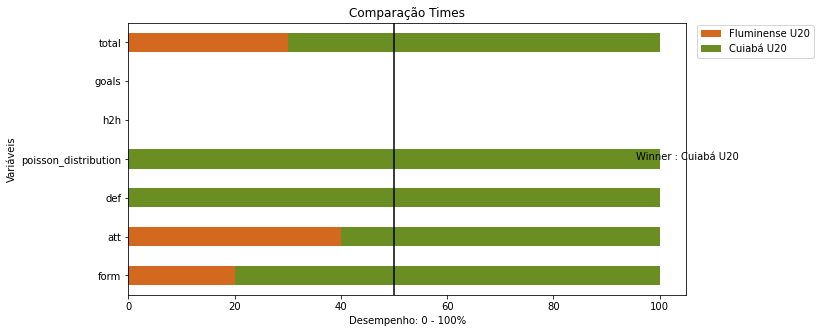

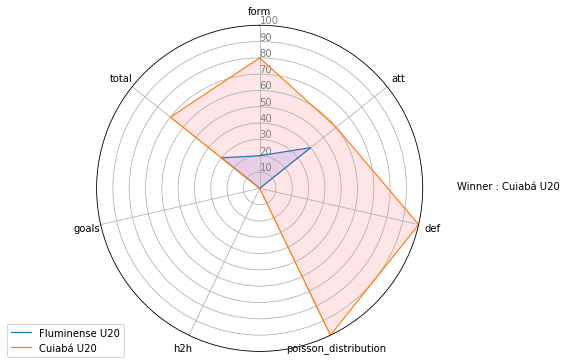

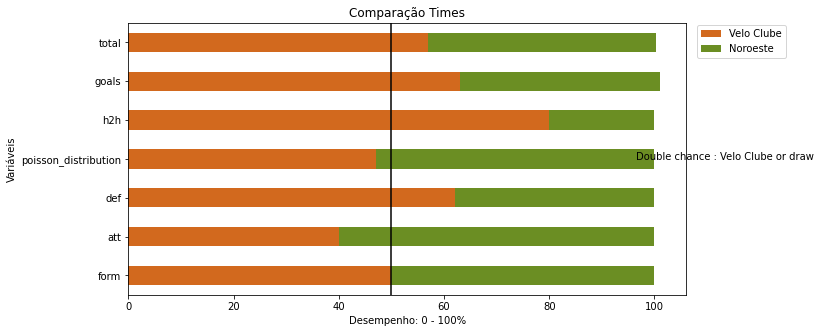

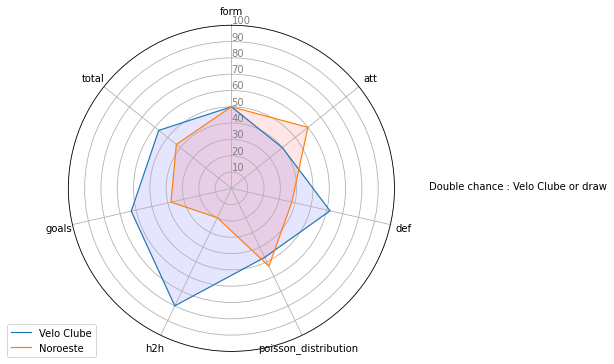

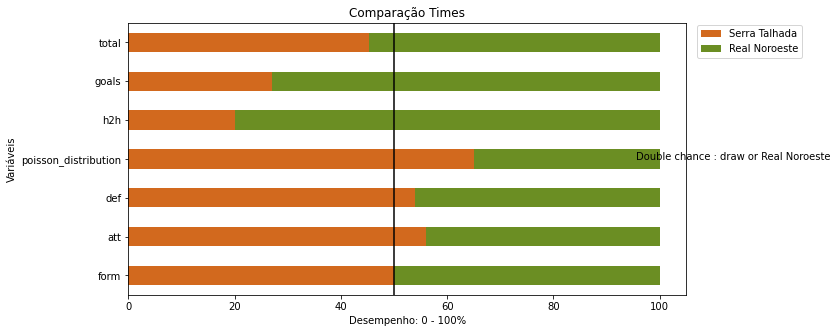

...

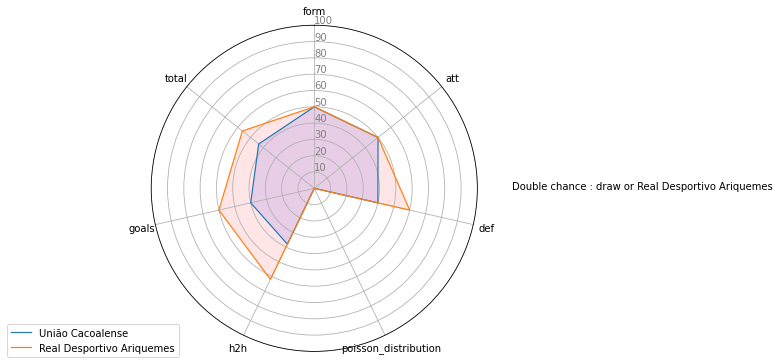

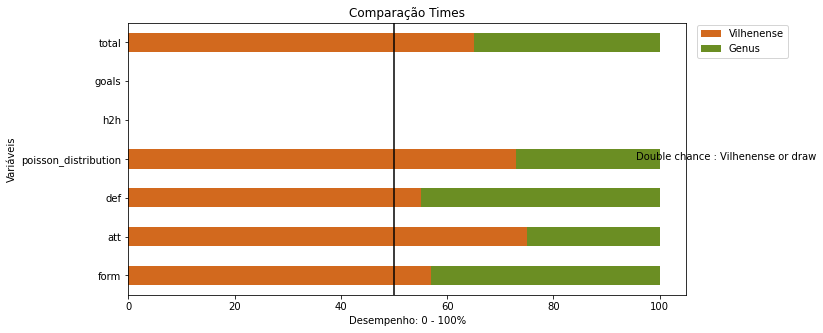

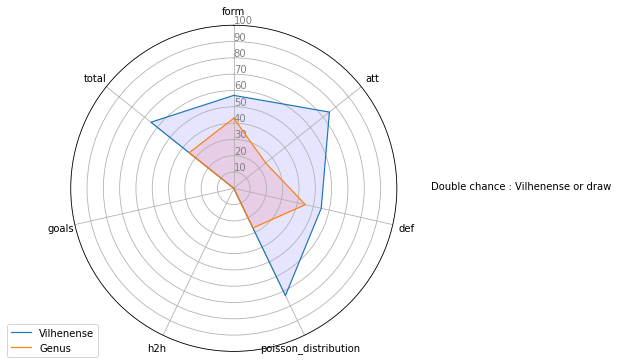

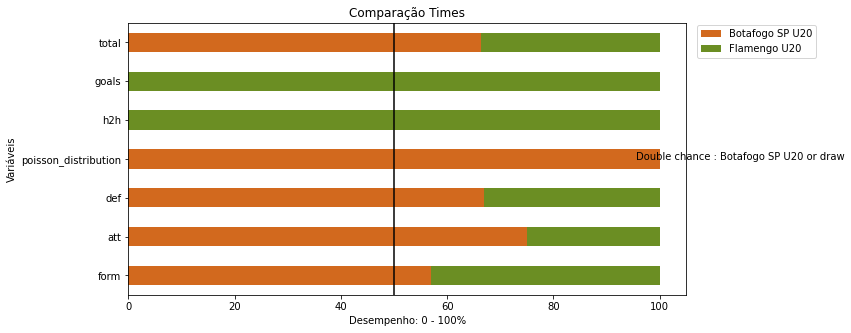

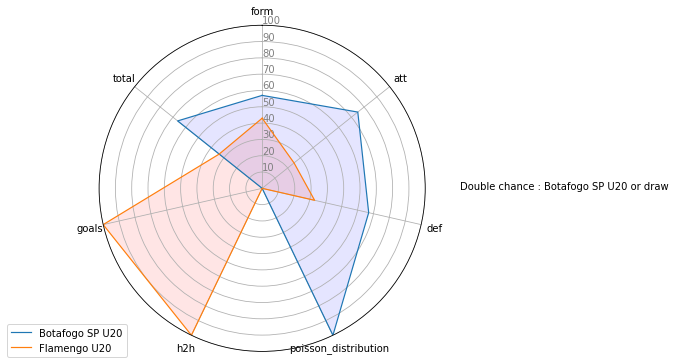

In [252]:
#Visualização dos dados do confronto - no caso de 1 partida selecionada

if len(str(pslgns)) < 8:
    viz_confrontos(df_predx)
    
if len(str(pslgns)) > 8:
    for i in df_predx['fixture.id']:
        viz_confrontos(df_predx[df_predx['fixture.id']==i])

In [256]:
# Substituindo '.home' por '' apenas nas colunas que contêm a palavra 'comparison'
cols_to_replace_h = [col for col in df_predh.columns if 'comparison' in col]
cols_to_replace_a = [col for col in df_preda.columns if 'comparison' in col]
df_predh.rename(columns={col: col.replace('.home', '') for col in cols_to_replace_h}, inplace=True)
df_preda.rename(columns={col: col.replace('.away', '') for col in cols_to_replace_a}, inplace=True)

In [277]:
#concatena as informacoes de home e away novamente, de forma a termos 2 linhas, uma para cada time
df_pred2 = pd.concat([df_predh,df_preda])

134

In [279]:
#concatena as informacoes com os dados de confrontos
cft3 = cft2.merge(df_pred2, on = ['fixture.id','team.id'], how = 'left')

#remove o simbolo de porcentagem das colunas numéricas
cft3 = cft3.replace({'%':''}, regex = True)

(134, 264)

In [65]:
#exporta para excel
cft3.to_excel('estatisticas_confrontos.xlsx')

## 1.6 Em Validação - Análise de Jogos Ao Vivo para Bets

### 1.6.1 Jogos com Cartões Vermelhos

# 2. Jogador x Jogador

## 2.1 Buscar player por nome (mais recomendado)

In [51]:
#cria um dataframe com todas as ligas disponiveis
lg = 'https://v3.football.api-sports.io/leagues'
lg = requests.request("GET", lg, headers=headers, data=payload)
lg = lg.json()
lg = json_normalize(lg['response'])
lg = lg[['league.id','league.name','league.type','country.name']]

#conferir league
pais = 'France'
#liga = 'UEFA'

lg[lg.eq(pais).any(1)]

,league.id,league.name,league.type,country.name
2,61,Ligue 1,League,France
16,62,Ligue 2,League,France
41,63,National 1,League,France
42,66,Coupe de France,Cup,France
43,65,Coupe de la Ligue,Cup,France
44,67,National 2 - Group A,League,France
45,68,National 2 - Group B,League,France
46,69,National 2 - Group C,League,France
47,70,National 2 - Group D,League,France
143,526,Trophée des Champions,Cup,France


In [54]:
#pesquisar

nome1 = 'Messi'

nome2 = 'Mbappe'

league = 61

In [344]:
def play_x_play(nome, league):
    play_name1 = 'https://v3.football.api-sports.io/players?search='+ str(nome) + '&league=' + str(league)
    play_name1 = requests.request("GET", play_name1, headers=headers, data=payload)
    play_name1 = play_name1.json()
    play_name1 = json_normalize(play_name1['response'])
    play_name1 = flatten_nested_json_df(play_name1)
    
    # Cálculo da idade correta
    play_name1['player.birth.date'] = pd.to_datetime(play_name1['player.birth.date'])
    play_name1['player.age.adjusted'] = play_name1['statistics.league.season'] - play_name1['player.birth.date'].dt.year
    
    return play_name1

In [395]:
play_name1 = play_x_play(nome1, league)
play_name2 = play_x_play(nome2, league)

#concatena
playxplay = pd.concat([play_name1,play_name2])

#filtra para a season de 2022 (pode ser 2023)
playxplay = playxplay.query("`statistics.league.season`==2022")

#reseta o index
playxplay = playxplay.reset_index(drop = True)

In [396]:
#transforma as colunas em float

for i in playxplay.iloc[:,23:].columns:
    try:
        playxplay[i] = playxplay[i].astype(float)
    except Exception:
        pass

In [399]:
pp_pergame = playxplay[[col for col in playxplay.columns if 'statistics' in col
           ]].iloc[:, 11:].fillna(0).drop(columns = 'statistics.games.position').div(playxplay['statistics.games.appearences'], axis = 0).round(2)

pp_pergame.columns = [str(col) + '.pergame' for col in pp_pergame.columns]

playxplay = playxplay.join(pp_pergame)

In [58]:
#playxplay.to_excel('playxplay.xlsx')

## 2.1 Buscar player por ID (necessita saber o id dos jogadores)

In [640]:
# #pesquisar por id (só permite se preenchido o campo Season)

# id1 = 278

# id2 = 276

# league = 61

# season = 2022

In [684]:
# play_id1 = 'https://v3.football.api-sports.io/players?id='+ str(id1) + '&league=' + str(league) + '&season=' + str(season)
# play_id1 = requests.request("GET", play_id1, headers=headers, data=payload)
# play_id1 = play_id1.json()
# play_id1
# play_id1 = json_normalize(play_id1['response'])
# play_id1 = flatten_nested_json_df(play_id1)

# play_id2 = 'https://v3.football.api-sports.io/players?id='+ str(id2) + '&league=' + str(league) + '&season=' + str(season)
# play_id2 = requests.request("GET", play_id2, headers=headers, data=payload)
# play_id2 = play_id2.json()
# play_id2
# play_id2 = json_normalize(play_id2['response'])
# play_id2 = flatten_nested_json_df(play_id2)

# playidxplayid = pd.concat([play_id1,play_id2])

# pxpid = playidxplayid.select_dtypes(include=['int', 'float']).reset_index().drop(columns = ['index','level_0'])

# pxgames = pxpid.iloc[:,7:].div(pxpid['statistics.games.appearences'], axis = 0)

# pxgames.columns = [str(col) + '.pergame' for col in pxgames.columns]

# playidxplayid = playidxplayid.reset_index().drop(columns = ['index','level_0'])

# pxp = pd.concat([playidxplayid,pxgames], axis = 1)

# 3. Banco de Odds - Odds de todas as partidas de determinado período

In [59]:
#cria um range de datas para +- X dias

from datetime import datetime
date = datetime.today().strftime('%Y-%m-%d')

import datetime
#seleciona a range de datas
x_dias_inicio = 10
x_dias_fim = 1

#date = hoje, datet0 = hoje - X dias, datet1 = hoje + X dias
datet0 = (datetime.date.today()) + datetime.timedelta(days=-x_dias_inicio)
datet1 = (datetime.date.today()) + datetime.timedelta(days=+x_dias_fim)

#escolher data inicio e fim - opcoes (date = hoje, datet0 = hoje - X dias, datet1 = hoje + X dias)

#data inicio
print(datet0)

#data fim
print(datet1)

#puxa as datas de inicio até a data fim
date_list = (pd.date_range(start=datet0, end=datet1,
                           freq='D')).strftime('%Y-%m-%d').tolist()

#traz a lista de jogos que ocorrerão na durante o período selecionado
df_stream = pd.concat([req_padrao(stream_req,i) for i in date_list])

#filtra as partidas de acordo com critérios
     #todas as partidas
df_stream
     #partidas que ja ocorreram
df_stream_fs = df_stream[df_stream['fixture.status.long']=="Match Finished"]    
     #partidas que ainda nao ocorreram
df_stream_ns = df_stream[df_stream['fixture.status.long']=="Not Started"]

#cria uma lista com as fixture.ids para iterar
     #todas as partidas
ps = list(df_stream['fixture.id'])
     #partidas que ja ocorreram
pslgfs = list(df_stream_fs['fixture.id']) 
     #partidas que ainda nao ocorreram
pslgns = list(df_stream_ns['fixture.id'])

2023-03-12
2023-03-23


In [60]:
#baixar odds de partidas futuras
    #use pslgns
print(len(pslgns))

#baixar odds de partidas passadas
    #use pslgfs
print(len(pslgfs))

#baixar odds de partidas futuras e passadas
    #use partidas_stream
print(len(ps))

319
5377
5952


In [288]:
#faz a requisicao das odds
df_st_l = ps.copy()

cf_odds = pd.concat([req_padrao(odds_req,i) for i in df_st_l])

In [290]:
#da parse no json, transforma as odds em formato long e cria a coluna fixture.id para possibilitar identificacao

cf_odds_db = []

for i,j in zip(range(cf_odds.shape[0]),cf_odds['fixture.id'].unique()):
    cfo = json_normalize((cf_odds.iloc[i,:])['bookmakers'])
    cfo = flatten_nested_json_df(cfo.explode('bets'))
    cfo['bets.values.odd'] = cfo['bets.values.odd'].astype(float)
    cfo = cfo.drop(columns = 'index').reset_index(drop = True)
    cfo['fixture.id'] = j
    name = str(j) + '_' + str(cf_odds.iloc[i,:]['league.season']) + '_' +str(cf_odds.iloc[i,:]['league.country'])
    
    #salva os dados em csv para cada partida
    cfo.to_csv(f'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\odds_bd\\{name}.csv')
    cf_odds_db.append(cfo)

# 4. Banco de Estatísticas Históricas de um Campeonato

## 4.1 Verificar a League / ID do Campeonato
https://dashboard.api-football.com/soccer/ids

In [61]:
#cria um dataframe com todas as ligas disponiveis
lg = 'https://v3.football.api-sports.io/leagues'
lg = requests.request("GET", lg, headers=headers, data=payload)
lg = lg.json()
lg = json_normalize(lg['response'])
lg = lg[['league.id','league.name','league.type','country.name']]

#conferir league
pais = 'Spain'
#liga = 'UEFA'

lg[lg.eq(pais).any(1)]

,league.id,league.name,league.type,country.name
10,140,La Liga,League,Spain
205,556,Super Cup,Cup,Spain
253,141,Segunda División,League,Spain
284,142,Primera División Femenina,League,Spain
385,143,Copa del Rey,Cup,Spain
481,435,Primera División RFEF - Group 1,League,Spain
482,436,Primera División RFEF - Group 2,League,Spain
483,437,Primera División RFEF - Group 3,League,Spain
484,438,Primera División RFEF - Group 4,League,Spain
485,439,Tercera División RFEF - Group 1,League,Spain


In [13]:
#seleciona a league e o range desejado

league = 140
season = range(2016,2023,1)

## 4.2 Dataframe com todas as partidas da League

In [12]:
#fix_as = pd.concat([req_padrao(league_fix_req,i) for i in season])

In [14]:
#realiza a requisição para obter as partidas
fix_as = []

for i in season:

    fix = 'https://v3.football.api-sports.io/fixtures?league='+str(league)+'&season='+str(i)
    fix = requests.request("GET", fix, headers=headers, data=payload)
    fix = fix.json()
    fix = fix['response']
    fix = json_normalize(fix)
    fix_as.append(fix)
    
fix_as = pd.concat(fix_as)

In [15]:
#cria uma lista dos ids das partidas
list_complete = fix_as['fixture.id'].to_list()

#agrupa essa lista em grupos de 20 e coloca no formato 'id1-id2-id3-...-id20',
#para facilitar e requisitar 20 partidas de uma vez
#a documentacao permite um maximo de 20
chunks = [list_complete[i:i+20] for i in range(0, len(list_complete), 20)]
chk = []
for chunk in chunks:
    chk.append('-'.join(map(str, chunk)))

#confere o tamanho
len(chk)

133

In [16]:
#faz a requisicao para as infos detalhadas das partidas
league_matches = pd.concat([req_padrao(fix_req,i) for i in chk])

In [ ]:
#ordena de acordo com a data
league_matches = league_matches.sort_values(by = 'fixture.date')

In [17]:
#confere quantas ja ocorreram e quantas irao ocorrer
league_matches.groupby('fixture.status.long').size()

fixture.status.long
Match Finished        2540
Not Started             20
Time to be defined     100
dtype: int64

In [18]:
#aplica a funcao transform fixture para abrir as colunas statistics, players e lineups
lm = transform_fixture(league_matches)

In [19]:
#salva o historico de partidas num csv com o nome da liga e pais
nome_liga = league_matches['league.name'].unique().astype(str)[0].lower().replace(' ','')
nome_pais = league_matches['league.country'].unique().astype(str)[0].lower().replace(' ','')
league_matches.to_csv(f'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\campeonatos\\{nome_liga}_{nome_pais}.csv', index = True)

In [19]:
#dobra o tamanho dataframe das partidas, dividindo os jogos em 1 linha por time

#time home
league_matches1 = league_matches.copy()
league_matches1['team.id'] = league_matches1['teams.home.id']

#time away
league_matches2 = league_matches.copy()
league_matches2['team.id'] = league_matches2['teams.away.id']

#uniao de ambos
league_matches_c = pd.concat([league_matches1,league_matches2]).sort_values(by = 'fixture.date')

In [20]:
#faz um merge da base de partidas com as estatisticas
matches_complete = league_matches_c.merge(lm[3], on=['fixture.id', 'team.id'], how='left').merge(
    lm[2], on=['fixture.id', 'team.id', 'team.name'],
    how='left').merge(lm[1],
                      on=['fixture.id', 'team.id', 'team.name','team.logo'],
                      how='left')

In [21]:
#visualiza as partidas que ja ocorreram
matches_complete[(matches_complete['fixture.status.short'] != 'NS')
                 & (matches_complete['fixture.status.short'] != 'TBD') &
                 (matches_complete['fixture.status.short'] !='PST')].iloc[:, 4:].tail(10)

,fixture.id,fixture.referee,fixture.timezone,fixture.date,fixture.timestamp,fixture.periods.first,fixture.periods.second,fixture.venue.id,fixture.venue.name,fixture.venue.city,fixture.status.long,fixture.status.short,fixture.status.elapsed,league.id,league.name,league.country,league.logo,league.flag,league.season,league.round,teams.home.id,teams.home.name,teams.home.logo,teams.home.winner,teams.away.id,teams.away.name,teams.away.logo,teams.away.winner,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,score.extratime.home,score.extratime.away,score.penalty.home,score.penalty.away,team.id,team.name,team.logo,Ball Possession,Blocked Shots,Corner Kicks,Fouls,Goalkeeper Saves,Offsides,Passes %,Passes accurate,Red Cards,Shots insidebox,Shots off Goal,Shots on Goal,Shots outsidebox,Total Shots,Total passes,Yellow Cards,statistics.offsides,statistics.shots.total,statistics.shots.on,statistics.goals.total,statistics.goals.conceded,statistics.goals.assists,statistics.goals.saves,statistics.passes.total,statistics.passes.key,statistics.passes.accuracy,statistics.tackles.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.duels.total,statistics.duels.won,statistics.dribbles.attempts,statistics.dribbles.success,statistics.dribbles.past,statistics.fouls.drawn,statistics.fouls.committed,statistics.cards.yellow,statistics.cards.red,statistics.penalty.won,statistics.penalty.commited,statistics.penalty.scored,statistics.penalty.missed,statistics.penalty.saved,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.games.rating.M,formation,startXI,substitutes,team.colors,coach.id,coach.name,coach.photo,team.colors.player.primary,team.colors.player.number,team.colors.player.border,team.colors.goalkeeper.primary,team.colors.goalkeeper.number,team.colors.goalkeeper.border
5310,838369,Flavio Rodrigues De Souza,UTC,2022-11-13T19:00:00+00:00,1668366000,1.668366e+09,1.668370e+09,235.0,Arena Pantanal,"Cuiabá, Mato Grosso",Match Finished,FT,90.0,71,Serie A,Brazil,https://media-3.api-sports.io/football/leagues...,https://media-2.api-sports.io/flags/br.svg,2022,Regular Season - 38,1193,Cuiaba,https://media-1.api-sports.io/football/teams/1...,True,147,Coritiba,https://media-3.api-sports.io/football/teams/1...,False,2.0,1.0,2.0,0.0,2.0,1.0,None,None,None,None,1193,Cuiaba,https://media-1.api-sports.io/football/teams/1...,57.0,2.0,8.0,9.0,1.0,2.0,89.0,441.0,NaN,17.0,7.0,8.0,NaN,17.0,497.0,1.0,2.0,15.0,8.0,2.0,1.0,1.0,1.0,497.0,13.0,27.562500,18.0,0.0,7.0,89.0,44.0,11.0,4.0,2.0,9.0,9.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,6.981250,6.866667,7.100000,7.037500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5311,838368,Marcelo de Lima Henrique,UTC,2022-11-13T19:00:00+00:00,1668366000,1.668366e+09,1.668370e+09,240.0,Estádio de Hailé Pinheiro,"Goiânia, Goiás",Match Finished,FT,90.0,71,Serie A,Brazil,https://media-3.api-sports.io/football/leagues...,https://media-2.api-sports.io/flags/br.svg,2022,Regular Season - 38,151,Goias,https://media-3.api-sports.io/football/teams/1...,False,126,Sao Paulo,https://media-1.api-sports.io/football/teams/1...,True,0.0,4.0,0.0,1.0,0.0,4.0,None,None,None,None,151,Goias,https://media-3.api-sports.io/football/teams/1...,36.0,1.0,3.0,12.0,3.0,1.0,80.0,266.0,NaN,5.0,3.0,2.0,1.0,6.0,331.0,2.0,1.0,5.0,2.0,0.0,4.0,0.0,3.0,331.0,6.0,16.625000,16.0,2.0,9.0,81.0,51.0,11.0,7.0,3.0,12.0,12.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,6.493333,6.328571,6.750000,6.600000,4-2-3-1,"[{'player': {'id': 10335, 'name': 'Tadeu', 'nu...","[{'player': {'id': 305980, 'name': 'Douglas', ...",NaN,3054,Jair Ventura,https://media-1.api-sports.io/football/coachs/...,006633,ffffff,006633,000000,ffffff,000000
5312,838367,Paulo Henrique Schleinch Vollkopf,UTC,2022-11-13T19:00:00+00:00,1668366000,1.668366e+09,1.668370e+09,225.0,Estádio Governador Plácido Aderaldo Castelo,"Fortaleza, Ceará",Match Finished,FT,90.0,71,Serie A,Brazil,https://media-3.api-sports.io/football/leagues...,ht

In [22]:
#nomeia o dataframe filtrado
mc = matches_complete[(matches_complete['fixture.status.short'] != 'NS')
                 & (matches_complete['fixture.status.short'] != 'TBD') &
                 (matches_complete['fixture.status.short'] !='PST')].iloc[:, 4:]

#verifica linhas onde Posse de Bola e null. 
#nesses casos, deve-se considerar que a API nao possui todas as informacoes daquela partida
print(mc.shape)

print(mc[~mc['Ball Possession'].isnull()].shape)

(5320, 101)
(5302, 101)


## 4.3 Previsões da API - Verifica os acertos feito pela API

In [20]:
#faz a requisicao das previsoes por partida
import time

df_pred = []

for i in list(league_matches['fixture.id']):

#adiciona um try except para caso o limite de requisicoes seja ultrapassado, para evitar um break no processo
    try:
        fixrange2 = 'https://v3.football.api-sports.io/predictions?fixture='+ str(i)
        fixrange_r2 = requests.request("GET", fixrange2, headers=headers, data=payload)
        fixrange_r2 = fixrange_r2.json()
        fixrange_r2

        df_predx = (json_normalize(fixrange_r2['response']))
        df_predx['fixture.id'] = i
        df_pred.append(df_predx)
    
    except SSLError:
        fixrange2 = 'https://v3.football.api-sports.io/predictions?fixture='+ str(i)
        fixrange_r2 = requests.request("GET", fixrange2, headers=headers, data=payload)
        fixrange_r2 = fixrange_r2.json()
        fixrange_r2

        df_predx = (json_normalize(fixrange_r2['response']))
        df_predx['fixture.id'] = i
        df_pred.append(df_predx)

#concatena os resultados
df_pred = pd.concat(df_pred)

In [36]:
# df_pred2 = []

# for i in list(set(list(league_matches['fixture.id'])) - set(list(df_pred['fixture.id']))):
#     fixrange2 = 'https://v3.football.api-sports.io/predictions?fixture='+ str(i)
#     fixrange_r2 = requests.request("GET", fixrange2, headers=headers, data=payload)
#     fixrange_r2 = fixrange_r2.json()
#     fixrange_r2

#     df_predx = (json_normalize(fixrange_r2['response']))
#     df_predx['fixture.id'] = i
#     df_pred2.append(df_predx)

#df_preda = pd.concat(df_pred2)
#df_predb = pd.concat(df_pred)

#concatena os resultados
#df_pred = pd.concat([df_pred,df_preda])

In [ ]:
# #faz a requisicao das previsoes por partida

# for i in list(league_matches['fixture.id']):

# #adiciona um try except para caso o limite de requisicoes seja ultrapassado, para evitar um break no processo
# df_pred = pd.concat([req_padrao(pred_req,i) for i in league_matches['fixture.id']])

In [64]:
#salva as previsoes de partidas num csv com o nome da liga e pais

nome_liga = league_matches['league.name'].unique().astype(str)[0].lower().replace(' ','')
nome_pais = league_matches['league.country'].unique().astype(str)[0].lower().replace(' ','')
df_pred.to_csv(f'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\campeonatos\\pred_{nome_liga}_{nome_pais}.csv', index = False)

In [65]:
#cria a coluna winner e classifica os resultados como 1, 2 e X para se assemelhar aos Bets
lg_matches = league_matches.copy()

lg_matches['winner'] = np.where(
    lg_matches['score.fulltime.home'] >
    lg_matches['score.fulltime.away'], '1',
    np.where(
        lg_matches['score.fulltime.home'] <
        lg_matches['score.fulltime.away'], '2',
        np.where(
            lg_matches['score.fulltime.home'] ==\
            lg_matches['score.fulltime.away'], 'X', 'NoRes')))

#remove aquelas partidas que nao ocorreram
lg_matches = lg_matches[lg_matches['winner']!='NoRes']

In [66]:
#verifica o acerto das previsoes da API para o campeonato em questao

#filtra as variáveis
pred = df_pred[['fixture.id','predictions.winner.comment','predictions.winner.name','predictions.advice']]

#drop NO PREDS AVAILABLE
pred = pred[df_pred['predictions.advice']!='No predictions available']

#dividir em várias colunas aquelas tips que possuem 'AND'
pred[['tip1','tip2']] = pred['predictions.advice'].str.split('and', expand = True)
pred[['1','tip1']] = pred['tip1'].str.split(':',expand = True)
pred = pred.drop(columns = '1')

#contar quantas são double chance, combo double chance, combo winner e winner
pred[['tip_type','suggestion']] = pred['predictions.advice'].str.split(':', expand = True)
pred = pred.drop(columns = 'suggestion')

group_advices = pred.groupby('tip_type').size() / len(pred) * 100

#transformar os times home e away em 1 ou 2 para padronização da leitura das tips
pred = pred.merge(lg_matches[['fixture.id','teams.home.name','teams.away.name']])
pred['cod'] = pred['predictions.winner.name'].eq(pred['teams.home.name']).apply(lambda x: 1 if x else 2)

#adicionar uma coluna com valores 'X' para quando a tip for de dupla chance
#junta as colunas para criar os resultados do tipo: 1, 2, 1X, 12, 2X
pred['dupla_chance'] = pred['tip1'].apply(lambda x: 'X' if 'draw' in x else np.nan)
pred['prediction'] = pred['cod'].astype(str) + pred['dupla_chance']
pred['prediction'] = pred['prediction'].fillna(pred['cod'])

pred = pred.merge(lg_matches[['fixture.id','winner','score.fulltime.home','score.fulltime.away']])
pred['ttgols'] = pred['score.fulltime.home'] + pred['score.fulltime.away']

#realiza um tratamento nas variáveis que serão comparadas
pred['cod'] = pred['cod'].astype(str)
pred['dupla_chance'] = pred['dupla_chance'].fillna('-') 

#cria a coluna para validar se as previsões foram corretas
pred['winner_correct_prediction'] = 'NO'

def check_prediction(row):
    if row['winner'] == row['cod'] or row['winner'] == row['dupla_chance']:
        return 'YES'
    else:
        return 'NO'
pred['winner_correct_prediction'] = pred.apply(check_prediction, axis=1)

#analise se as apostas do tipo 'Combo' também foram corretas. Para isso, divide as tips do tipo over/under em colunas separadas
pred[['a','b','c']] = pred['tip2'].str.split(' ', expand = True)

    #separa as colunas pelo + ou -
pred[['over_under','goals']] = pred['b'].str.extract('([+-]?)(\d+\.?\d*)')

    #substitui + por > e - por <
pred['over_under'] = pred['over_under'].str.replace('-','<').replace('+','>')

    #transforma em float
pred['goals'] = pred['goals'].astype(float)
    
    #remove colunas desnecessárias
pred = pred.drop(columns = ['a','b','c'])

    #quando gols totais > over ou gols totais < under, coloca True, se não False, e np.nan para onde não há infos
pred['overunder_correct_prediction'] = pred.apply(lambda x: x['ttgols'] < x['goals'] if x['over_under'] == '<' else (x['ttgols'] > x['goals'] if x['over_under'] == '>' else '-'), axis=1)

    #tranforma True em YES e False em NO
pred['overunder_correct_prediction'] = pred['overunder_correct_prediction'].astype(str).str.replace('True','YES').str.replace('False','NO')

#remove colunas desnecessárias e reordena
pred = pred.filter(['fixture_id', 'predictions.winner.comment','predictions.winner.name',
       'predictions.advice', 'tip_type', 'prediction','tip2','winner','winner_correct_prediction','ttgols','overunder_correct_prediction'])

pred['total_correct_prediction'] = pred.apply(lambda x: 'YES' if x['winner_correct_prediction'] == 'YES' and x['overunder_correct_prediction'] == 'YES' else ('-' if x['overunder_correct_prediction'] == '-' else 'NO'), axis=1)

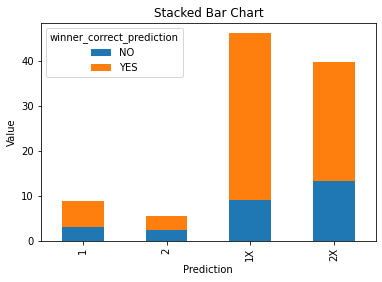

                                      value
prediction winner_correct_prediction       
1          NO                          2.91
           YES                         5.86
2          NO                          2.43
           YES                         2.99
1X         NO                          8.97
           YES                        37.15
2X         NO                         13.19
           YES                        26.50


In [69]:
#verifica a quantidade de acertos por categoria (1, 2, 1X, 2X)
vpred = (pred.groupby(['prediction', 'winner_correct_prediction']).size() /
 pred.shape[0] * 100).to_frame().rename(columns={0: 'value'}).round(2)#.plot.barh()

# group and sum the values
grouped = vpred.groupby(['prediction', 'winner_correct_prediction'])['value'].sum()

# reshape the DataFrame
stacked = grouped.unstack()
stacked.plot.bar(stacked=True)

# set the axis labels and title
plt.xlabel('Prediction')
plt.ylabel('Value')
plt.title('Stacked Bar Chart')

# show

plt.show()

print(vpred)

In [70]:
#validacao dos resultados
print(pred.groupby('tip_type').size()/len(pred)*100, '\n')
print(pred.groupby('prediction').size()/len(pred)*100, '\n')
print(pred.groupby('winner').size()/len(pred)*100, '\n')
print(pred.groupby('winner_correct_prediction').size()/len(pred)*100, '\n')
print(pred[pred['overunder_correct_prediction']!='-'].groupby('overunder_correct_prediction').size()/len(pred[pred['overunder_correct_prediction']!='-'])*100, '\n')
print(pred[pred['total_correct_prediction']!='-'].groupby('total_correct_prediction').size()/len(pred[pred['total_correct_prediction']!='-'])*100)

tip_type
Combo Double chance     18.652850
Combo Winner             3.507373
Double chance           67.158230
Winner                  10.681546
dtype: float64 

prediction
1      8.768434
2      5.420486
1X    46.113990
2X    39.697090
dtype: float64 

winner
1    45.117577
2    28.577122
X    26.305301
dtype: float64 

winner_correct_prediction
NO     27.500996
YES    72.499004
dtype: float64 

overunder_correct_prediction
NO     25.719424
YES    74.280576
dtype: float64 

total_correct_prediction
NO     46.76259
YES    53.23741
dtype: float64


# 5. Modelagem Preditiva / Machine Learning

## 5.1 Leitura das partidas e Pré-processamento dos dados

In [71]:
#delimita as colunas a serem convertidas em json no momento da leitura do csv
JSON_COLUMNS = ['statistics', 'events', 'players', 'lineups']

#faz a leitura para as partidas
league_matches = pd.read_csv(
    'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\campeonatos\\seriea_brazil.csv',
    index_col = 0,
    converters={column: literal_eval
                for column in JSON_COLUMNS})  #.drop(columns = 'Unnamed: 0')


league_matches = league_matches.sort_values(by = 'fixture.date')
#aplica a funcao transform fixture para abrir as colunas statistics, players e lineups
lm = transform_fixture(league_matches)

#dobra o tamanho dataframe das partidas, dividindo os jogos em 1 linha por time

#time home
league_matches1 = league_matches.copy()
league_matches1['team.id'] = league_matches1['teams.home.id']

#time away
league_matches2 = league_matches.copy()
league_matches2['team.id'] = league_matches2['teams.away.id']

#uniao de ambos
league_matches_c = pd.concat([league_matches1,
                              league_matches2]).sort_values(by='fixture.date')

#faz um merge da base de partidas com as estatisticas
matches_complete = league_matches_c.merge(
    lm[3], on=['fixture.id', 'team.id'],
    how='left').merge(lm[2],
                      on=['fixture.id', 'team.id', 'team.name'],
                      how='left').merge(lm[1],
                                        on=[
                                            'fixture.id', 'team.id',
                                            'team.name', 'team.logo'
                                        ],
                                        how='left')

In [79]:
#matches_complete = matches_complete.sort_values(by = 'fixture.date')

In [80]:
#cria a coluna target do modelo, winner 2 se casa, winner 1 se empate, winner 0 se visitante
matches_complete['winner'] = np.where(
    matches_complete['teams.home.winner'] == True, 2,
    np.where(matches_complete['teams.home.winner'] == False, 0, 1))

#remove colunas desnecessarias
matches_complete_filtered = matches_complete\
.query("`fixture.status.short`!=['TBD','NS']")\
.drop(columns=[
        'events','statistics','lineups','players',
        'fixture.referee', 'fixture.timestamp', 'fixture.timezone',
        'fixture.periods.first', 'fixture.periods.second', 'fixture.venue.id',
        'fixture.venue.city', 'fixture.venue.name', 'fixture.status.elapsed',
        'team.logo', 'league.name', 'league.country', 'league.logo','league.flag','fixture.status.short',
        'fixture.status.long', 'teams.home.winner', 'teams.away.winner',
        'teams.home.name', 'teams.away.name', 'teams.home.logo',
        'teams.away.logo', 'score.extratime.home', 'score.extratime.away',
        'score.penalty.home', 'score.penalty.away',
        'formation', 'startXI', 'substitutes', 'team.colors', 'coach.id',
        'coach.name', 'coach.photo', 'team.colors.player.primary',
        'team.colors.player.number', 'team.colors.player.border',
        'team.colors.goalkeeper.primary', 'team.colors.goalkeeper.number',
        'team.colors.goalkeeper.border'
    ])

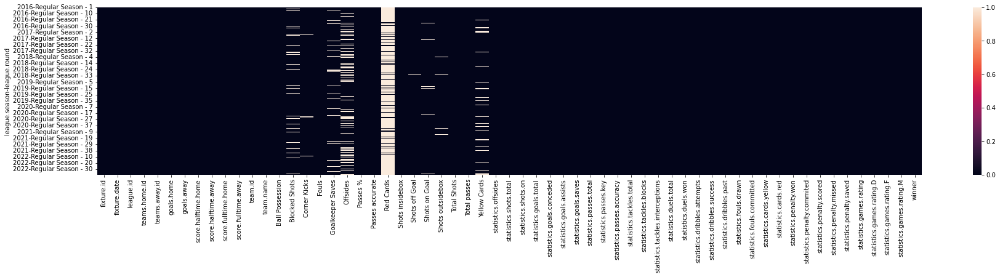

['team.name', 'Blocked Shots', 'Corner Kicks', 'Fouls', 'Goalkeeper Saves', 'Offsides', 'Red Cards', 'Shots insidebox', 'Shots off Goal', 'Shots on Goal', 'Shots outsidebox', 'Yellow Cards']


In [84]:
#visualiza dados faltantes na base para imputacao ou exclusao
    #o que e comum? valores NaN quando as variaveis sao, na verdade, iguais a 0, como Red Cards, Offsides, Yellow Cards, etc
    #o que nao e comum? valores NaN ou 0 para colunas que deveriam ter algum valor, como Ball Possession, Passes %

fig, ax = plt.subplots(figsize = (30,5))

sns.heatmap(matches_complete_filtered.set_index(['league.season','league.round']).isnull(), ax = ax)

plt.show()

print(matches_complete_filtered.columns[matches_complete_filtered.isnull().sum() > 0].tolist())

In [85]:
#imputa os dados das colunas derivadas de 'players', comecadas por 'statistics.'
    #substitui NaN pela media do time naquela season

players_columns = [col for col in matches_complete_filtered.columns if 'statistics' in col]

matches_complete_filtered[players_columns] = matches_complete_filtered.groupby(['team.id','league.season'])[players_columns].apply(lambda x: x.fillna(x.mean()))

In [83]:
#imputa os dados missing pela media para todas as colunas onde BP e P% sao 0 ou nan
#pois presume-se que os dados nao sejam confiaveis

matches_complete_filtered.loc[    (matches_complete_filtered['Ball Possession'] == 0) |
    (matches_complete_filtered['Ball Possession'].isna()) |
    (matches_complete_filtered['Passes %'] == 0) |
    (matches_complete_filtered['Passes %'].isna()),
    :] = matches_complete_filtered.groupby(
        ['team.id', 'league.season']).apply(lambda x: x.fillna(x.mean()))

In [86]:
#substitui os valores restantes por 0
matches_complete_filtered = matches_complete_filtered.fillna(0)

In [87]:
#transforma a coluna league_round em numerica
matches_complete_filtered['league.round'] = matches_complete_filtered['league.round'].str.strip('Regular Season - ').astype(int)

#SE ERRO

#para algumas ligar europeias (coluna expected_goals)
#matches_complete_filtered = matches_complete_filtered.drop(columns = 'expected_goals')

#caso bundesliga
#matches_complete_filtered = matches_complete_filtered[~matches_complete_filtered['league.round'].isin(['Finals','Relegation Round'])]

In [90]:
stats_columns = [
    'Ball Possession', 'Blocked Shots', 'Corner Kicks', 'Fouls',
    'Goalkeeper Saves', 'Offsides', 'Passes %', 'Passes accurate', 'Red Cards',
    'Shots insidebox', 'Shots off Goal', 'Shots on Goal', 'Shots outsidebox',
    'Total Shots', 'Total passes', 'Yellow Cards'
]

In [91]:
#Calcula a média móvel para as variáveis desejadas
df_mm = matches_complete_filtered.groupby([
    'league.season',
    'team.id',
])[matches_complete_filtered[stats_columns + players_columns].columns].rolling(5).mean()

#Defasagem
df_mm = df_mm[df_mm.columns.difference(['league.season', 'team.id'])].groupby(
    ['league.season', 'team.id']).shift(1).reset_index()

df_mm = df_mm.rename(columns = {'level_2':'index'})

#Retorna os valores para a base original
matches_complete_filtered = matches_complete_filtered.drop(columns=[col for col in matches_complete_filtered.columns if col in stats_columns or col in players_columns], axis=1).reset_index().merge(df_mm, how = 'left')

In [92]:
#Cria uma nova variável binária 'home', identificando se o time está jogando em casa ou fora
matches_complete_filtered.loc[matches_complete_filtered['team.id'] == matches_complete_filtered['teams.home.id'],
                  'home'] = 1
matches_complete_filtered.loc[matches_complete_filtered['team.id'] != matches_complete_filtered['teams.home.id'],
                  'home'] = 0

#Atribui a quantidade de pontos ganhos por cada time, em cada jogo
matches_complete_filtered['pontos'] = 0

matches_complete_filtered.loc[(matches_complete_filtered['winner']==2) & (matches_complete_filtered['home']==1), 'pontos'] = 3
matches_complete_filtered.loc[(matches_complete_filtered['winner']==0) & (matches_complete_filtered['home']==0), 'pontos'] = 3
matches_complete_filtered.loc[(matches_complete_filtered['winner']==1), 'pontos'] = 1

#Realiza a soma cumulativa dos pontos
df_aprov = matches_complete_filtered.groupby(['league.season','team.id'])['pontos'].cumsum()
matches_complete_filtered['pontos_acum'] = df_aprov
matches_complete_filtered = matches_complete_filtered.drop(columns = 'pontos')

#Calcula os pontos possíveis caso o time tivesse ganhado todos os jogos
matches_complete_filtered['pontos_posv'] = matches_complete_filtered['league.round']*3

#Calcula o aproveitamento
matches_complete_filtered['aproveitamento'] = matches_complete_filtered['pontos_acum'] / matches_complete_filtered['pontos_posv']

matches_complete_filtered['aproveitamento'] = matches_complete_filtered.groupby(['league.season','team.id'])['aproveitamento'].shift(1)

#Remove colunas desnecessárias
matches_complete_filtered = matches_complete_filtered.drop(columns = ['pontos_acum','pontos_posv'])

matches_complete_filtered = matches_complete_filtered.fillna(0)

In [93]:
#Removendo as primeiras e últimas N rodadas
n = 3
matches_complete_filtered = matches_complete_filtered[(matches_complete_filtered['league.round']>n) & (matches_complete_filtered['league.round']<matches_complete_filtered['league.round'].max()-n)]

#Reordenando a base
matches_complete_filtered = matches_complete_filtered.sort_values(by = ['fixture.date','fixture.id'])

In [94]:
matches_complete_filtered.tail()

,index,fixture.id,fixture.date,league.id,league.season,league.round,teams.home.id,teams.away.id,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,team.id,team.name,winner,Ball Possession,Blocked Shots,Corner Kicks,Fouls,Goalkeeper Saves,Offsides,Passes %,Passes accurate,Red Cards,Shots insidebox,Shots off Goal,Shots on Goal,Shots outsidebox,Total Shots,Total passes,Yellow Cards,statistics.cards.red,statistics.cards.yellow,statistics.dribbles.attempts,statistics.dribbles.past,statistics.dribbles.success,statistics.duels.total,statistics.duels.won,statistics.fouls.committed,statistics.fouls.drawn,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.games.rating.M,statistics.goals.assists,statistics.goals.conceded,statistics.goals.saves,statistics.goals.total,statistics.offsides,statistics.passes.accuracy,statistics.passes.key,statistics.passes.total,statistics.penalty.commited,statistics.penalty.missed,statistics.penalty.saved,statistics.penalty.scored,statistics.penalty.won,statistics.shots.on,statistics.shots.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.tackles.total,home,aproveitamento
5235,5235,838321,2022-10-27T22:30:00+00:00,71,2022,34,1062,152,1.0,0.0,1.0,0.0,1.0,0.0,152,Juventude,2,45.0,4.4,4.8,9.2,3.6,0.8,84.0,332.0,0.0,7.2,6.8,3.0,7.0,14.2,392.2,2.0,0.0,2.0,14.8,6.0,5.6,86.0,44.2,9.2,11.6,6.755536,6.646000,6.873333,6.782024,1.0,2.2,3.6,1.0,0.8,21.318333,11.4,392.2,0.0,0.0,0.0,0.0,0.0,3.0,9.8,2.6,12.8,13.8,0.0,0.212121
5236,5236,838329,2022-10-27T23:00:00+00:00,71,2022,34,1193,145,1.0,0.0,0.0,0.0,1.0,0.0,1193,Cuiaba,2,48.8,5.0,6.2,12.2,2.8,1.2,76.8,314.2,0.2,9.2,6.8,3.8,6.4,15.6,394.6,2.8,0.2,2.6,12.2,4.8,5.0,96.4,49.6,11.8,12.4,6.691607,6.581429,6.823333,6.739429,0.2,1.8,2.8,0.8,1.2,19.506319,8.8,376.4,0.2,0.0,0.0,0.2,0.2,3.8,10.6,2.8,7.4,11.6,1.0,0.313131
5237,5237,838329,2022-10-27T23:00:00+00:00,71,2022,34,1193,145,1.0,0.0,0.0,0.0,1.0,0.0,145,Avai,2,54.6,3.4,7.2,10.8,3.6,1.2,84.2,386.2,0.0,5.4,6.4,2.4,6.8,12.2,458.6,1.8,0.0,1.8,13.8,5.6,7.8,95.0,49.4,10.8,14.2,6.637500,6.567333,6.658000,6.672571,0.0,2.4,3.6,0.4,1.2,24.422500,8.8,458.6,0.2,0.0,0.0,0.2,0.0,2.4,8.8,2.4,9.2,14.0,0.0,0.282828
5238,5238,838308,2022-10-29T23:30:00+00:00,71,2022,32,151,131,0.0,0.0,0.0,0.0,0.0,0.0,151,Goias,1,43.4,2.4,4.4,17.6,4.2,1.8,75.6,242.6,0.0,7.2,5.0,4.8,5.0,12.2,318.0,4.0,0.0,4.0,11.4,3.6,6.0,101.0,52.4,17.6,15.2,6.861917,6.833833,6.960333,6.872286,0.8,1.8,4.2,1.4,1.8,15.638333,8.8,318.0,0.2,0.0,0.0,0.2,0.0,4.8,9.8,4.2,10.2,15.6,1.0,0.411765
5239,5239,838308,2022-10-29T23:30:00+00:00,71,2022,32,151,131,0.0,0.0,0.0,0.0,0.0,0.0,131,Corinthians,1,54.4,3.8,5.4,11.0,2.6,1.4,83.8,437.0,0.2,7.2,2.8,4.4,3.8,11.0,518.6,2.4,0.2,2.4,13.4,6.4,6.2,86.0,43.8,10.0,10.0,6.863718,6.860000,6.906667,6.883929,1.2,1.0,2.6,1.4,1.2,28.351026,8.6,498.6,0.0,0.0,0.0,0.2,0.2,4.2,6.8,4.6,8.0,16.8,0.0,0.558824


## 5.2 União com base de predictions

In [95]:
#faz a leitura para as predictions
df_pred = pd.read_csv(r'C:\Users\vinicius.felizatti\Desktop\Bets Brain\campeonatos\pred_seriea_brazil.csv')

In [96]:
#divisao das estatisticas fornecidas nas previsoes em time .home e .away

#coloca em index as variaveis comuns a ambos
df_predx = df_pred.set_index([
    'predictions.winner.id', 'predictions.winner.name',
    'predictions.winner.comment', 'predictions.win_or_draw',
    'predictions.under_over'
])

#separa as variaveis referentes ao time .away
df_preda = df_predx.filter([i for i in df_predx.columns if 'away.' in i] + [
    'fixture.id',
    'comparison.form.away',
    'comparison.att.away',
    'comparison.def.away',
    'comparison.poisson_distribution.away',
    'comparison.h2h.away',
    'comparison.goals.away',
    'comparison.total.away',
]).reset_index().rename(columns={'teams.away.id': 'team.id'})

df_preda.columns = df_preda.columns.str.replace('away.', '')

#separa as variaveis referentes ao time .home
df_predh = df_predx.filter([i for i in df_predx.columns if 'home.' in i] + [
    'fixture.id',
    'comparison.form.home',
    'comparison.att.home',
    'comparison.def.home',
    'comparison.poisson_distribution.home',
    'comparison.h2h.home',
    'comparison.goals.home',
    'comparison.total.home',
]).reset_index().rename(columns={'teams.home.id': 'team.id'})

df_predh.columns = df_predh.columns.str.replace('home.', '')

In [97]:
# Substituindo '.home' por '' apenas nas colunas que contêm a palavra 'comparison'
cols_to_replace_h = [col for col in df_predh.columns if 'comparison' in col]
cols_to_replace_a = [col for col in df_preda.columns if 'comparison' in col]
df_predh.rename(columns={col: col.replace('.home', '') for col in cols_to_replace_h}, inplace=True)
df_preda.rename(columns={col: col.replace('.away', '') for col in cols_to_replace_a}, inplace=True)

In [128]:
#concatena as informacoes de home e away novamente, de forma a termos 2 linhas, uma para cada time
df_pred2 = pd.concat([df_predh,df_preda])

In [129]:
#remove as colunas que possuem valores em percentage
#remove as colunas que possuem valores discretos (comparison e biggest)
#TESTE - remove tambem as colunas de comparison

df_pred2 = df_pred2.drop(columns=[
    col for col in df_pred2.columns if '.percentage' in col
    or 'comparison' in col or 'biggest' in col or 'predictions' in col
])

In [130]:
#remove colunas nao numericas

df_pred2 = df_pred2.drop(columns=[
    'teams.last_5.form', 'teams.last_5.att', 'teams.last_5.def',
    'teams.league.form', 'teams.league.fixtures.played.home',
    'teams.league.fixtures.played.away', 'teams.league.fixtures.played.total',
    'teams.league.lineups','teams.name','teams.logo'
])

#transforma NaNs em 0
df_pred2 = df_pred2.fillna(0)

In [311]:
#concatena as informacoes com os dados de confrontos

matches_cmp_filt_pred = matches_complete_filtered.merge(df_pred2, on = ['fixture.id','team.id'], how = 'left')

matches_cmp_filt_pred.tail(6)

,index,fixture.id,fixture.date,league.id,league.season,league.round,teams.home.id,teams.away.id,goals.home,goals.away,score.halftime.home,score.halftime.away,score.fulltime.home,score.fulltime.away,team.id,team.name,winner,Ball Possession,Blocked Shots,Corner Kicks,Fouls,Goalkeeper Saves,Offsides,Passes %,Passes accurate,Red Cards,Shots insidebox,Shots off Goal,Shots on Goal,Shots outsidebox,Total Shots,Total passes,Yellow Cards,statistics.cards.red,statistics.cards.yellow,statistics.dribbles.attempts,statistics.dribbles.past,statistics.dribbles.success,statistics.duels.total,statistics.duels.won,statistics.fouls.committed,statistics.fouls.drawn,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.games.rating.M,statistics.goals.assists,statistics.goals.conceded,statistics.goals.saves,statistics.goals.total,statistics.offsides,statistics.passes.accuracy,statistics.passes.key,statistics.passes.total,statistics.penalty.commited,statistics.penalty.missed,statistics.penalty.saved,statistics.penalty.scored,statistics.penalty.won,statistics.shots.on,statistics.shots.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.tackles.total,home,aproveitamento,teams.last_5.goals.for.total,teams.last_5.goals.for.average,teams.last_5.goals.against.total,teams.last_5.goals.against.average,teams.league.fixtures.wins.home,teams.league.fixtures.wins.away,teams.league.fixtures.wins.total,teams.league.fixtures.draws.home,teams.league.fixtures.draws.away,teams.league.fixtures.draws.total,teams.league.fixtures.loses.home,teams.league.fixtures.loses.away,teams.league.fixtures.loses.total,teams.league.goals.for.total.home,teams.league.goals.for.total.away,teams.league.goals.for.total.total,teams.league.goals.for.average.home,teams.league.goals.for.average.away,teams.league.goals.for.average.total,teams.league.goals.for.minute.0-15.total,teams.league.goals.for.minute.16-30.total,teams.league.goals.for.minute.31-45.total,teams.league.goals.for.minute.46-60.total,teams.league.goals.for.minute.61-75.total,teams.league.goals.for.minute.76-90.total,teams.league.goals.for.minute.91-105.total,teams.league.goals.for.minute.106-120.total,teams.league.goals.against.total.home,teams.league.goals.against.total.away,teams.league.goals.against.total.total,teams.league.goals.against.average.home,teams.league.goals.against.average.away,teams.league.goals.against.average.total,teams.league.goals.against.minute.0-15.total,teams.league.goals.against.minute.16-30.total,teams.league.goals.against.minute.31-45.total,teams.league.goals.against.minute.46-60.total,teams.league.goals.against.minute.61-75.total,teams.league.goals.against.minute.76-90.total,teams.league.goals.against.minute.91-105.total,teams.league.goals.against.minute.106-120.total,teams.league.clean_sheet.home,teams.league.clean_sheet.away,teams.league.clean_sheet.total,teams.league.failed_to_score.home,teams.league.failed_to_score.away,teams.league.failed_to_score.total,teams.league.penalty.scored.total,teams.league.penalty.missed.total,teams.league.penalty.total,teams.league.cards.yellow.0-15.total,teams.league.cards.yellow.16-30.total,teams.league.cards.yellow.31-45.total,teams.league.cards.yellow.46-60.total,teams.league.cards.yellow.61-75.total,teams.league.cards.yellow.76-90.total,teams.league.cards.yellow.91-105.total,teams.league.cards.yellow.106-120.total,teams.league.cards.red.0-15.total,teams.league.cards.red.16-30.total,teams.league.cards.red.31-45.total,teams.league.cards.red.46-60.total,teams.league.cards.red.61-75.total,teams.league.cards.red.76-90.total,teams.league.cards.red.91-105.total,teams.league.cards.red.106-120.total,teams.league.cards.yellow..total,teams.league.cards.red..total
4334,5234,838321,2022-10-27T22:30:00+00:00,71,2022,34,1062,152,1.0,0.0,1.0,0.0,1.0,0.0,1062,Atletico-MG,2,56.0,4.0,10.2,13.6,2.2,1.2,82.8,391.0,0.0,6.2,5.6,3.2,6.6,12.8,468.2,2.2,0.0,2.2,12.0,8.0,5.4,101.6,50.2,13.6,14.2,6.852500,6.997143,6.919000,6.772286,0

In [312]:
#Move as variáveis imutáveis para o índice
matches_cmp_filt_pred = matches_cmp_filt_pred.set_index([
    'fixture.id', 'fixture.date', 'league.round', 'league.season', 'teams.home.id'
    , 'teams.away.id', 'winner','league.id'
]).drop(columns=['team.id','team.name'])

#Divide as bases de acordo com a coluna home
matches_cmp_filt_pred_home = matches_cmp_filt_pred.loc[matches_cmp_filt_pred['home'] == 1].rename(
    columns={'goals.home': 'score'})

matches_cmp_filt_pred_away = matches_cmp_filt_pred.loc[matches_cmp_filt_pred['home'] == 0].rename(
    columns={'goals.away': 'score'})

print(matches_cmp_filt_pred_home.shape)
print(matches_cmp_filt_pred_away.shape)

#Faz a subtração entre as duas
matches_cmp_filt_pred_modelo = matches_cmp_filt_pred_home - matches_cmp_filt_pred_away

#Removemos as colunas de Score e voltamos as variáveis league.season e league.round para o dataframe
matches_cmp_filt_pred_modelo = matches_cmp_filt_pred_modelo.drop(
    columns=['goals.away', 'goals.home', 'score', 'home']).reset_index(
        level=[2, 3])

(2170, 124)
(2170, 124)


In [313]:
matches_cmp_filt_pred_modelo.tail()

,,,,,,league.round,league.season,Ball Possession,Blocked Shots,Corner Kicks,Fouls,Goalkeeper Saves,Offsides,Passes %,Passes accurate,Red Cards,Shots insidebox,Shots off Goal,Shots on Goal,Shots outsidebox,Total Shots,Total passes,Yellow Cards,aproveitamento,index,score.fulltime.away,score.fulltime.home,score.halftime.away,score.halftime.home,statistics.cards.red,statistics.cards.yellow,statistics.dribbles.attempts,statistics.dribbles.past,statistics.dribbles.success,statistics.duels.total,statistics.duels.won,statistics.fouls.committed,statistics.fouls.drawn,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.games.rating.M,statistics.goals.assists,statistics.goals.conceded,statistics.goals.saves,statistics.goals.total,statistics.offsides,statistics.passes.accuracy,statistics.passes.key,statistics.passes.total,statistics.penalty.commited,statistics.penalty.missed,statistics.penalty.saved,statistics.penalty.scored,statistics.penalty.won,statistics.shots.on,statistics.shots.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.tackles.total,teams.last_5.goals.against.average,teams.last_5.goals.against.total,teams.last_5.goals.for.average,teams.last_5.goals.for.total,teams.league.cards.red..total,teams.league.cards.red.0-15.total,teams.league.cards.red.106-120.total,teams.league.cards.red.16-30.total,teams.league.cards.red.31-45.total,teams.league.cards.red.46-60.total,teams.league.cards.red.61-75.total,teams.league.cards.red.76-90.total,teams.league.cards.red.91-105.total,teams.league.cards.yellow..total,teams.league.cards.yellow.0-15.total,teams.league.cards.yellow.106-120.total,teams.league.cards.yellow.16-30.total,teams.league.cards.yellow.31-45.total,teams.league.cards.yellow.46-60.total,teams.league.cards.yellow.61-75.total,teams.league.cards.yellow.76-90.total,teams.league.cards.yellow.91-105.total,teams.league.clean_sheet.away,teams.league.clean_sheet.home,teams.league.clean_sheet.total,teams.league.failed_to_score.away,teams.league.failed_to_score.home,teams.league.failed_to_score.total,teams.league.fixtures.draws.away,teams.league.fixtures.draws.home,teams.league.fixtures.draws.total,teams.league.fixtures.loses.away,teams.league.fixtures.loses.home,teams.league.fixtures.loses.total,teams.league.fixtures.wins.away,teams.league.fixtures.wins.home,teams.league.fixtures.wins.total,teams.league.goals.against.average.away,teams.league.goals.against.average.home,teams.league.goals.against.average.total,teams.league.goals.against.minute.0-15.total,teams.league.goals.against.minute.106-120.total,teams.league.goals.against.minute.16-30.total,teams.league.goals.against.minute.31-45.total,teams.league.goals.against.minute.46-60.total,teams.league.goals.against.minute.61-75.total,teams.league.goals.against.minute.76-90.total,teams.league.goals.against.minute.91-105.total,teams.league.goals.against.total.away,teams.league.goals.against.total.home,teams.league.goals.against.total.total,teams.league.goals.for.average.away,teams.league.goals.for.average.home,teams.league.goals.for.average.total,teams.league.goals.for.minute.0-15.total,teams.league.goals.for.minute.106-120.total,teams.league.goals.for.minute.16-30.total,teams.league.goals.for.minute.31-45.total,teams.league.goals.for.minute.46-60.total,teams.league.goals.for.minute.61-75.total,teams.league.goals.for.minute.76-90.total,teams.league.goals.for.minute.91-105.total,teams.league.goals.for.total.away,teams.league.goals.for.total.home,teams.league.goals.for.total.total,teams.league.penalty.missed.total,teams.league.penalty.scored.total,teams.league.penalty.total
fixture.id,fixture.date,teams.home.id,teams.away.id,winner,league.id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
838323,2022-10-27T22:00:00+00:00,126,144,2,71,34,2022,16.8,0.2,0.0,-3.8,-0.4,1.0,5.4,149.0,0.6,0.0,-0.2,-0.6,-0.6,-0.6,150.2,-0.4,0.141414,-2,0.0,0.0,0.0,0.0,0.6,-0.4,3.2,0.2,

## Em validação - 5.3 Informacoes de Coachs

In [136]:
coach_list = list(matches_complete['coach.id'].dropna().unique())

len(coach_list)

123

In [137]:
tec = pd.concat([req_padrao(coach_req,i) for i in coach_list])

In [173]:
nome_liga = league_matches_c['league.name'].unique().astype(str)[0].lower().replace(' ','')
nome_pais = league_matches_c['league.country'].unique().astype(str)[0].lower().replace(' ','')
tec.to_csv(f'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\campeonatos\\tec_{nome_liga}_{nome_pais}.csv', index = False)

In [138]:
dummy = pd.get_dummies(tec['nationality'])
dummy.columns = ['nationality_' +str(col).lower().replace(' ','') for col in dummy.columns]

tec_dummynat = pd.concat([tec,dummy], axis = 1)

tec_dummynat.columns = ['coach.' + str(col) for col in tec_dummynat.columns]

## Em validação - 5.4 Informacoes de Jogadores - Desempenho, Idade e Nacionalidade

In [294]:
players = []

for i, j, z in zip(range(matches_complete.shape[0]), matches_complete['fixture.id'], matches_complete['league.season']):
    try:
        pl = flatten_nested_json_df(
            json_normalize(matches_complete['players'].iloc[i], ['players'],
                           [['team', 'name'], ['team', 'id'], ['team', 'logo']]))

        pl['fixture.id'] = j
        pl['league.season'] = z
        players.append(pl)

    except Exception:
        pass

pls = pd.concat(players)

In [306]:
pls

In [329]:
len(pls['player.id'].unique())

2380

In [330]:
pls_league = pls.merge(matches_complete[['fixture.id','league.season']])

ids = pls_league[['player.id','league.season']]#.drop_duplicates()

names = pls_league[['player.name','player.id']]#.drop_duplicates()

In [331]:
names[['fn','ln']] = names['player.name'].str.split(' ', 1,expand = True)
names['ln'] = [unidecode(x) if x != None else np.nan for x in names['ln']]
names['ln'] = names['ln'].fillna(names['fn'])
names['ln'] = names['ln'].str.replace('-', ' ')
names

,player.name,player.id,fn,ln
0,Kléver,9734,Kléver,Kléver
1,Kléver,9734,Kléver,Kléver
2,Jonathan,9312,Jonathan,Jonathan
3,Jonathan,9312,Jonathan,Jonathan
4,Ricardo Silva,64000,Ricardo,Silva
5,Ricardo Silva,64000,Ricardo,Silva
6,Eduardo Gabriel,77670,Eduardo,Gabriel
7,Eduardo Gabriel,77670,Eduardo,Gabriel
8,Breno Lopes,80543,Breno,Lopes
9,Breno Lopes,80543,Breno,Lopes


In [144]:
jog_stats = []

for i, j, z in zip(names['ln'], names['fn'], names['player.id']):
    time.sleep(1)
    try:
        #print(i)
        nome1 = i
        #requisicao para o jogador1
        play_name1 = 'https://v3.football.api-sports.io/players?search='+ str(nome1) + '&league=' + str(league)
        play_name1 = requests.request("GET", play_name1, headers=headers, data=payload)
        play_name1 = play_name1.json()
        play_name1 = json_normalize(play_name1['response'])
        play_name1 = flatten_nested_json_df(play_name1)
        jog_stats.append(play_name1)
    except Exception as e:
        print(e)
        try:
            #print(j)
            nome1 = j
            #requisicao para o jogador1
            play_name1 = 'https://v3.football.api-sports.io/players?search='+ str(nome1) + '&league=' + str(league)
            play_name1 = requests.request("GET", play_name1, headers=headers, data=payload)
            play_name1 = play_name1.json()
            play_name1 = json_normalize(play_name1['response'])
            play_name1 = flatten_nested_json_df(play_name1)
            jog_stats.append(play_name1)
        except Exception as e:
            #print(e)
            try:
                for b in season:
                    #print(b,i,j,z)
                    play_id1 = 'https://v3.football.api-sports.io/players?id='+ str(z) + '&league=' + str(league) + '&season=' + str(b)
                    play_id1 = requests.request("GET", play_id1, headers=headers, data=payload)
                    play_id1 = play_id1.json()
                    play_id1 = json_normalize(play_id1['response'])
                    play_id1 = flatten_nested_json_df(play_id1)
                    jog_stats.append(play_id1)
            except Exception as e:
                #print(e)
                pass

Victor
Rodinei
Duarte
Juan
Jorge
Arao
Cuellar
Mancuello
Sheik
Guerrero
Cardoso
Ederson
Patrick
Cirino
Magrão
"['index'] not found in axis"
Magrão
2016 Magrão Magrão 9555
2017 Magrão Magrão 9555
2018 Magrão Magrão 9555
2019 Magrão Magrão 9555
Xavier
Henriquez
Durval
Renê
"['index'] not found in axis"
Renê
2016 Renê Renê 10163
2017 Renê Renê 10163
2018 Renê Renê 10163
2019 Renê Renê 10163
2020 Renê Renê 10163
2021 Renê Renê 10163
2022 Renê Renê 10163
Rithely
Xavier
Lenis
Souza
Gonzalez
Araujo
Serginho
Moura
De Melo
Prass
Jean
Martins
Hugo
Egídio
"['index'] not found in axis"
Egídio
2016 Egídio Egídio 10084
2017 Egídio Egídio 10084
2018 Egídio Egídio 10084
2019 Egídio Egídio 10084
2020 Egídio Egídio 10084
2021 Egídio Egídio 10084
2022 Egídio Egídio 10084
Tche
Sales
Guedes
Xavier
Jesus
Barrios
Moisés
"['index'] not found in axis"
Moisés
2016 Moisés Moisés 9928
2017 Moisés Moisés 9928
2018 Moisés Moisés 9928
2019 Moisés Moisés 9928
2020 Moisés Moisés 9928
Alecsandro
Marques
Weverton
Léo
"['

Augusto
Lins
Ferreira
Dierson
Bryan
Marciel
Alisson
Mineiro
Eduardo
Matheuzinho
Paraiba
Fabricio
Grassi
Lincoln
Henrique
Danilo
Claro
Braga
Manoel
Andrei
Valencia
Diogo
Cearense
Adalberto
Alberto
Kanu
Jair
Reis
Batista
Gilson
Luan
Araujo
Mineiro
Tiaguinho
Costa
Geferson
Anderson
Dourado
Maranhão
"['index'] not found in axis"
Maranhão
2016 Maranhão Maranhão 64288
2017 Maranhão Maranhão 64288
2018 Maranhão Maranhão 64288
Jailson
Tilica
Sidão
"['index'] not found in axis"
Sidão
2016 Sidão Sidão 10548
2017 Sidão Sidão 10548
2018 Sidão Sidão 10548
2019 Sidão Sidão 10548
2020 Sidão Sidão 10548
Barbosa
Airton
Amorim
Oswaldo
Silva
Bruno
Dracena
Yago
Maycon
Vaz
"['index'] not found in axis"
Rafael
Costa
Mendes
Caramelo
"['index'] not found in axis"
Caramelo
2016 Caramelo Caramelo 80592
2017 Caramelo Caramelo 80592
Bastos
Werley
Dodô
"['index'] not found in axis"
Dodô
2016 Dodô Dodô 10428
2017 Dodô Dodô 10428
2018 Dodô Dodô 10428
Rodrigues
Caju
Yuri
Clayton
Mayke
Silva
Réver
"['index'] not found

Becao
Heleno
Gustavo
Soutto
Santana
Conca
"['index'] not found in axis"
Dário
2016 Conca Dário 80355
Cardoso
Andrezinho
"['index'] not found in axis"
Andrezinho
2016 Andrezinho Andrezinho 77803
Monteiro
Carleto
"['index'] not found in axis"
Thiago
Norton
Guimaraes
Airton
Mascarenhas
Luan
Madson
Maicon
Roger
Brenner
Rhodolfo
Rômulo
"['index'] not found in axis"
Rômulo
2016 Rômulo Rômulo 10490
Perotti
Escudero
Cascardo
Anjos
Saraiva
Furtado
Araruna
Souza
Ribeiro
Cleiton
Mancini
Bremer
Marquinhos
Friedrich
Gomes
Jonathan
Ribeiro
Silva
Petros
Shaylon
Luis
Marques
Nathan
Paulista
Andrey
Freitas
Arboleda
Gomez
Jefferson
Ramos
Nonoca
"['index'] not found in axis"
Nonoca
2016 Nonoca Nonoca 80354
Motta
Paulinho
Geuvânio
"['index'] not found in axis"
Geuvânio
2016 Geuvânio Geuvânio 9901
Gilvan
Paulinho
Moisés
"['index'] not found in axis"
Moisés
2016 Moisés Moisés 10013
Paulo
Blanco
Patrick
Luizão
"['index'] not found in axis"
Luizão
2016 Luizão Luizão 9676
Kelven
Frazan
Brumado
Paulo
Sa
"['inde

Silva
Fabinho
Marcão
"['index'] not found in axis"
Marcão
2016 Marcão Marcão 0
Venuto
Abner
Safira
Locatelli
Aldo
Johnny
Vargas
Rangel
Felipe
Alves de Souza
"['index'] not found in axis"
Bruno
Breno
Kaio
Ferreira
Jonathan
Pedroso
Marcos
Glédson
"['index'] not found in axis"
Glédson
2016 Glédson Glédson 10511
Gomes
Edenílson
"['index'] not found in axis"
Edenílson
2016 Edenílson Edenílson 10387
Ferreira
Azevedo
Pec
"['index'] not found in axis"
Gabriel
Felipe
Tailson
Warley
Lucas
Vinícius
"['index'] not found in axis"
Vinícius
2016 Vinícius Vinícius 152610
Thalles
Dudu
Popp
Soares
Lima
Gabriel
Gomes
Guarin
Jobson
Megiolaro
Vinicius
Dalberto
Batista
Candido
Evanilson
Melo
Fernandes
Veron
Ramon
Marcinho
Lucas
Henrique
Gebing
"['index'] not found in axis"
Ronei
Costa
Prado
Veron
Isaque
Sandry
Felippi
"['index'] not found in axis"
Felipe
Netto
Frizzo
Robert Alves da Silva
"['index'] not found in axis"
Jhonata
Piton
Perri
Juan
Costa
Gomes Magalhaes
"['index'] not found in axis"
Danilo
Patric

Rodrigues
Cortez
Éverton
"['index'] not found in axis"
Éverton
2016 Éverton Éverton 9955
2017 Éverton Éverton 9955
2018 Éverton Éverton 9955
2019 Éverton Éverton 9955
2020 Éverton Éverton 9955
2021 Éverton Éverton 9955
2022 Éverton Éverton 9955
Granada
Silva
Cristiano
Buiu
"['index'] not found in axis"
Buiu
2016 Buiu Buiu 77958
Geovane
Julimar
Aderlan
Nicolas
Leonardo
Naressi
Alan
Wesley
David
Barbosa da Silva
Santos
Robinho
Tim
"['index'] not found in axis"
Wellington
Allanzinho
Araujo
Brenno
Heitor
Jhonata
Henrique
Lucas
Biel
Diego
Ramon
Conceicao
Camilo
Gava
Joaquim
Wálber
"['index'] not found in axis"
Wálber
2016 Wálber Wálber 9561
Rangel
Marques
Pato
Elias
Raulzinho
"['index'] not found in axis"
Raulzinho
2016 Raulzinho Raulzinho 133628
Carne
Mendes
HTTPSConnectionPool(host='v3.football.api-sports.io', port=443): Max retries exceeded with url: /players?search=Mendes&league=71 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000289FB4CB970>: Failed t

André
"['index'] not found in axis"
André
2016 André André 204016
Adriel
Costa
Zanocelo
Werton
Ramires
Davi
Varanda
Henrique
Freitas
Jenison
Toscano
Kelvi
Alexandre
Felicio
Felipe
Silva
Augusto
Chapeco
"['index'] not found in axis"
Gabriel
 Silva
Werton
Apis
Jaderson
Mancha
Manuel Cuesta
"['index'] not found in axis"
Juan
Neto
Jaderson
Camacho
Victor
Pedro
Michael
Andre
Borges
Vasconcelos
Alexandre
Queiroz
Diogenes
Melz
"['index'] not found in axis"
Denner
Marquinhos
Vitor
Fabrício
"['index'] not found in axis"
Fabrício
2016 Fabrício Fabrício 106464
Nogueira
Lázaro
"['index'] not found in axis"
Lázaro
2016 Lázaro Lázaro 237103
Uchoa
Linck
Edu
"['index'] not found in axis"
Edu
2016 Edu Edu 136124
Belezi
Sarará
"['index'] not found in axis"
Sarará
2016 Sarará Sarará 308892
Riquelme
Welison
Raniele
Ronald
Maurício
"['index'] not found in axis"
Maurício
2016 Maurício Maurício 106485
Marcelo
Kelsen
Airton
Sorriso
Kelvin
Campos
Felipe
Kelsen
Cabrera
Rodallega
Piquerez
Henriquez
Geovane
Gonca

In [324]:
js = pd.concat(jog_stats)
#js = js.drop_duplicates()
print(js.shape)

(67304, 60)


In [302]:
js['league.season'] = js['statistics.league.season'].astype(float)
js = js.drop(columns = ['statistics.league.season'])

In [271]:
nome_liga = league_matches_c['league.name'].unique().astype(str)[0].lower().replace(' ','')
nome_pais = league_matches_c['league.country'].unique().astype(str)[0].lower().replace(' ','')
js.to_csv(f'C:\\Users\\vinicius.felizatti\\Desktop\\Bets Brain\\campeonatos\\players_{nome_liga}_{nome_pais}.csv', index = False)

In [303]:
# Cálculo da idade correta
js['player.age.adjusted'] = js['player.age'] - (js['player.id'].map(js.groupby('player.id')['league.season'].max())-js['league.season'])

In [320]:
ab = matches_complete[['league.season', 'fixture.id','team.id']].drop_duplicates().merge(
    pls[['player.id', 'fixture.id','league.season']],
    how='left').merge(js[['player.id', 'league.season',
                          'player.age.adjusted','player.nationality']],
                      how='left')

ab.drop_duplicates()

,league.season,fixture.id,team.id,player.id,player.age.adjusted,player.nationality
0,2017,35097,124,9734,NaN,NaN
1,2017,35097,124,9312,28.0,Brazil
3,2017,35097,124,64000,NaN,NaN
4,2017,35097,124,77670,NaN,NaN
5,2017,35097,124,80543,33.0,Brazil
7,2017,35097,124,9717,32.0,Brazil
8,2017,35097,124,9695,32.0,Brazil
9,2017,35097,124,9541,27.0,Brazil
10,2017,35097,124,9325,27.0,Brazil
11,2017,35097,124,10073,NaN,NaN


In [246]:
p = pls.merge(js[['player.id','player.age.adjusted','player.nationality']], on = 'player.id', how = 'left')#[['player.id','player.age','team.id','player.nationality','fixture.id']]
p = p.drop_duplicates()

p

,index,player.id,player.name,player.photo,team.name,team.id,team.logo,statistics.offsides,statistics.games.minutes,statistics.games.number,statistics.games.position,statistics.games.rating,statistics.games.captain,statistics.games.substitute,statistics.shots.total,statistics.shots.on,statistics.goals.total,statistics.goals.conceded,statistics.goals.assists,statistics.goals.saves,statistics.passes.total,statistics.passes.key,statistics.passes.accuracy,statistics.tackles.total,statistics.tackles.blocks,statistics.tackles.interceptions,statistics.duels.total,statistics.duels.won,statistics.dribbles.attempts,statistics.dribbles.success,statistics.dribbles.past,statistics.fouls.drawn,statistics.fouls.committed,statistics.cards.yellow,statistics.cards.red,statistics.penalty.won,statistics.penalty.commited,statistics.penalty.scored,statistics.penalty.missed,statistics.penalty.saved,fixture.id,player.age.adjusted,player.nationality
0,0,10476,Paulo Victor,https://media-3.api-sports.io/football/players...,Flamengo,127,https://media-1.api-sports.io/football/teams/1...,None,90.0,48,G,7.2,False,False,0.0,0,NaN,0.0,NaN,1.0,13.0,0.0,56%,None,None,0.0,0,0,0.0,0.0,NaN,0,0,0,0,None,None,0,0,0.0,36285,NaN,NaN
1,1,10157,Rodinei,https://media-1.api-sports.io/football/players...,Flamengo,127,https://media-1.api-sports.io/football/teams/1...,None,90.0,2,D,7.0,False,False,1.0,0,NaN,NaN,NaN,NaN,37.0,0.0,92%,None,None,0.0,12,7,3.0,1.0,1.0,3,0,0,0,None,None,0,0,NaN,36285,31.0,Brazil
2,1,10157,Rodinei,https://media-1.api-sports.io/football/players...,Flamengo,127,https://media-1.api-sports.io/football/teams/1...,None,90.0,2,D,7.0,False,False,1.0,0,NaN,NaN,NaN,NaN,37.0,0.0,92%,None,None,0.0,12,7,3.0,1.0,1.0,3,0,0,0,None,None,0,0,NaN,36285,30.0,Brazil
4,1,10157,Rodinei,https://media-1.api-sports.io/football/players...,Flamengo,127,https://media-1.api-sports.io/football/teams/1...,None,90.0,2,D,7.0,False,False,1.0,0,NaN,NaN,NaN,NaN,37.0,0.0,92%,None,None,0.0,12,7,3.0,1.0,1.0,3,0,0,0,None,None,0,0,NaN,36285,29.0,Brazil
5,1,10157,Rodinei,https://media-1.api-sports.io/football/players...,Flamengo,127,https://media-1.api-sports.io/football/teams/1...,None,90.0,2,D,7.0,False,False,1.0,0,NaN,NaN,NaN,NaN,37.0,0.0,92%,None,None,0.0,12,7,3.0,1.0,1.0,3,0,0,0,None,None,0,0,NaN,36285,28.0,Brazil
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1392107,42,9960,Willian Farias,https://media-3.api-sports.io/football/players...,Coritiba,147,https://media-2.api-sports.io/football/teams/1...,NaN,17.0,8,M,6.7,False,True,NaN,NaN,NaN,0.0,NaN,NaN,1.0,NaN,1,1.0,NaN,NaN,2.0,1.0,NaN,NaN,NaN,NaN,1.0,1,0,NaN,NaN,0,0,NaN,838369,20.0,Brazil
1392134,43,9656,Léo Gamalho,https://media-2.api-sports.io/football/players...,Coritiba,147,https://media-2.api-sports.io/football/teams/1...,NaN,66.0,9,F,7.2,False,True,1.0,1.0,1.0,0.0,NaN,NaN,16.0,NaN,15,NaN,NaN,NaN,9.0,4.0,NaN,NaN,1.0,1.0,1.0,0,0,NaN,NaN,0,0,NaN,838369,37.0,Brazil
1392135,43,9656,Léo Gamalho,https://media-2.api-sports.io/football/players...,Coritiba,147,https://media-2.api-sports.io/football/teams/1...,NaN,66.0,9,F,7.2,False,True,1.0,1.0,1.0,0.0,NaN,NaN,16.0,NaN,15,NaN,NaN,NaN,9.0,4.0,NaN,NaN,1.0,1.0,1.0,0,0,NaN,NaN,0,0,NaN,838369,32.0,Brazil
1392136,43,9656,Léo Gamalho,https://media-2.api-sports.io/football/players...,Coritiba,147,https://media-2.api-sports.io/football/teams/1...,NaN,66.0,9,F,7.2,False,True,1.0,1.0,1.0,0.0,NaN,NaN,16.0,NaN,15,NaN,NaN,NaN,9.0,4.0,NaN,NaN,1.0,1.0,1.0,0,0,NaN,NaN,0,0,NaN,838369,30.0,Brazil


In [ ]:
jgd_yr_30 = jgd_avg\
.groupby(['league_season','league_round','team.id'], as_index = False)\
['player.age']\
.apply(lambda x: (x>30).sum())

jgd_yr_30 = jgd_yr_30.rename(columns = {'player.age':'qtdjgdyr30'})
jgd_yr_30.tail(6)

jgd_yr_30

In [227]:
p2 = p.groupby(['fixture.id','team.id'], as_index = False)['player.age'].mean()
p2 = p2.rename(columns = {'player.age':'player.age.mean'})

matches_complete = p2.merge(matches_complete, on = ['fixture.id','team.id'], how = 'left')

## 5.5 Aplicação do Modelo

#### - Análise Exploratória

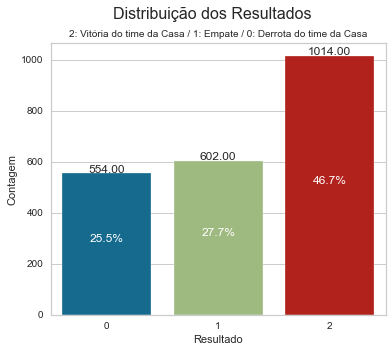

In [276]:
#questao das classes desbalanceadas

win_graph = matches_cmp_filt_pred_modelo.reset_index()[['fixture.id','winner']].drop_duplicates()


fig, ax = plt.subplots(figsize=(6,5))

sns.countplot(win_graph['winner'], ax = ax)

plt.suptitle('Distribuição dos Resultados', fontsize = 16)
plt.title('2: Vitória do time da Casa / 1: Empate / 0: Derrota do time da Casa', fontsize = 10)
plt.xlabel('Resultado')
plt.ylabel('Contagem')

ncount = len(win_graph)

for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y/2), 
            ha='center', va='bottom', color = 'white')
    
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()),  ha = 'center', va = 'center', xytext = (0, 4), textcoords = 'offset points')
    
plt.show()

In [277]:
#avalia a distribuicao das variaveis
display(matches_cmp_filt_pred_modelo.describe().T)

#avalia a correlacao entre as variaveis
display(matches_cmp_filt_pred_modelo.corr().unstack().reset_index().rename(columns={
    0: 'corr'
}).dropna().query('corr < 1').sort_values(by='corr')
       )

,count,mean,std,min,25%,50%,75%,max
league.round,2170.0,19.000000,8.946334,4.00000,11.0,19.0,27.0,34.0
league.season,2170.0,2019.000000,2.000461,2016.00000,2017.0,2019.0,2021.0,2022.0
Ball Possession,2170.0,-0.281913,9.524903,-61.40000,-5.6,0.0,5.2,60.8
Blocked Shots,2170.0,-0.067573,1.357772,-5.40000,-1.0,0.0,0.8,4.8
Corner Kicks,2170.0,-0.135982,2.004696,-7.20000,-1.4,0.0,1.2,8.4
Fouls,2170.0,0.023019,3.443873,-20.80000,-2.0,0.0,2.0,16.6
Goalkeeper Saves,2170.0,0.080080,1.257384,-5.40000,-0.8,0.0,1.0,4.8
Offsides,2170.0,-0.020770,0.885857,-3.80000,-0.6,0.0,0.6,2.8
Passes %,2170.0,-0.174452,9.046052,-85.92973,-3.6,0.0,3.2,87.4
Passes accurate,2170.0,-2.329194,98.211962,-459.80000,-64.8,0.0,55.8,468.8


,level_0,level_1,corr
10205,teams.league.failed_to_score.total,teams.league.goals.for.total.total,-0.798308
14719,teams.league.goals.for.total.total,teams.league.failed_to_score.total,-0.798308
9822,teams.league.clean_sheet.total,teams.league.goals.against.total.total,-0.797788
12994,teams.league.goals.against.total.total,teams.league.clean_sheet.total,-0.797788
12870,teams.league.goals.against.total.home,teams.league.clean_sheet.home,-0.764147
9698,teams.league.clean_sheet.home,teams.league.goals.against.total.home,-0.764147
11281,teams.league.fixtures.wins.total,teams.league.fixtures.loses.total,-0.746687
10915,teams.league.fixtures.loses.total,teams.league.fixtures.wins.total,-0.746687
9957,teams.league.failed_to_score.away,teams.league.goals.for.total.away,-0.746280
14471,teams.league.goals.for.total.away,teams.league.failed_to_score.away,-0.746280


### 5.5.1 Três Categorias - Classificar em Vitória Casa, Derrota Casa, Empate

#### 5.5.1.1 Seleção de Features

In [263]:
#SEPARACAO EM FEATURES E TARGET

X = matches_cmp_filt_pred_modelo
y = matches_cmp_filt_pred_modelo.reset_index()['winner']

In [256]:
def correlated_columns(df, threshold=0.85):
    return (
        df.corr()
        .pipe(
            lambda df1: pd.DataFrame(
                np.tril(df1, k=-1),
                columns=df.columns,
                index=df.columns,
            )
        )
    .stack()
    .rename("pearson")
    .pipe(
        lambda s: s[
            s.abs() > threshold
        ].reset_index()
    )
        .query("level_0 not in level_1")
    )

cr =correlated_columns(X)

X = X.drop(columns = cr['level_0'])

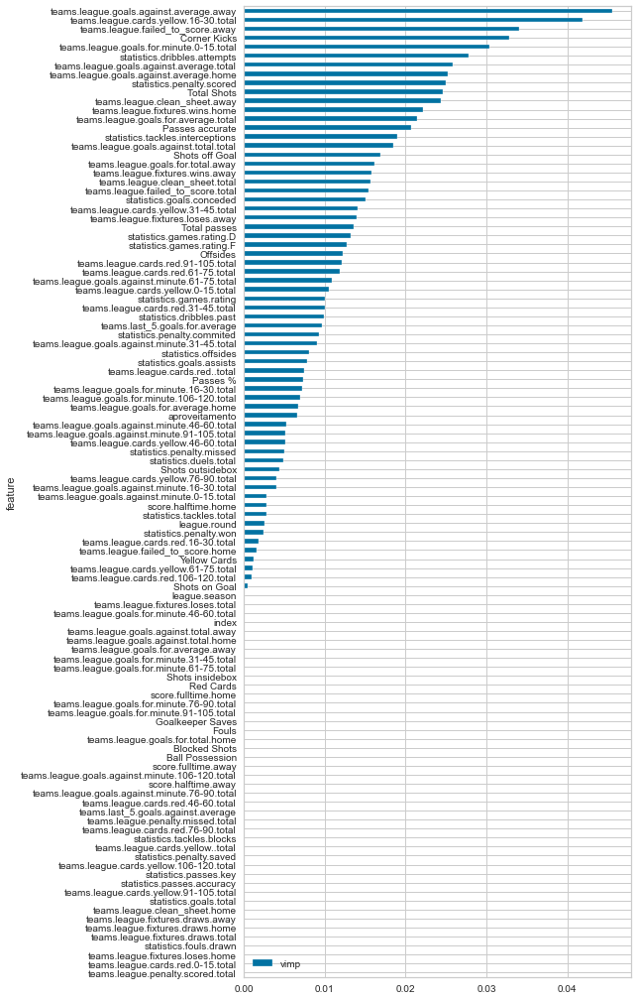

50

In [257]:
mic = feature_selection.mutual_info_classif(X, y, random_state = 42)

fig, ax = plt.subplots(figsize=(7, 18))

features = pd.DataFrame({
    'feature': X.columns,
    "vimp": mic
})

features.set_index('feature').sort_values(by = 'vimp').plot.barh(ax = ax)

plt.show()

mask = features.set_index('feature').apply(lambda x: x>0.005).reset_index()

features = features[mask.vimp]

X = X[(features.set_index('feature').index)]

X.shape[1]

In [258]:
X.tail()

,,,,,,Corner Kicks,Offsides,Passes %,Passes accurate,Shots off Goal,Total Shots,Total passes,aproveitamento,statistics.dribbles.attempts,statistics.dribbles.past,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.goals.assists,statistics.goals.conceded,statistics.offsides,statistics.penalty.commited,statistics.penalty.missed,statistics.penalty.scored,statistics.tackles.interceptions,teams.last_5.goals.for.average,teams.league.cards.red..total,teams.league.cards.red.31-45.total,teams.league.cards.red.61-75.total,teams.league.cards.red.91-105.total,teams.league.cards.yellow.0-15.total,teams.league.cards.yellow.16-30.total,teams.league.cards.yellow.31-45.total,teams.league.cards.yellow.46-60.total,teams.league.clean_sheet.away,teams.league.clean_sheet.total,teams.league.failed_to_score.away,teams.league.failed_to_score.total,teams.league.fixtures.loses.away,teams.league.fixtures.wins.away,teams.league.fixtures.wins.home,teams.league.goals.against.average.away,teams.league.goals.against.average.home,teams.league.goals.against.average.total,teams.league.goals.against.minute.31-45.total,teams.league.goals.against.minute.46-60.total,teams.league.goals.against.minute.61-75.total,teams.league.goals.against.minute.91-105.total,teams.league.goals.against.total.total,teams.league.goals.for.average.home,teams.league.goals.for.average.total,teams.league.goals.for.minute.0-15.total,teams.league.goals.for.minute.106-120.total,teams.league.goals.for.minute.16-30.total,teams.league.goals.for.total.away
fixture.id,fixture.date,teams.home.id,teams.away.id,winner,league.id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
838323,2022-10-27T22:00:00+00:00,126,144,2,71,0.0,1.0,5.4,149.0,-0.2,-0.6,150.2,0.141414,3.2,0.2,0.036083,-0.056976,0.432000,0.6,-0.2,1.0,0.2,0.0,-0.2,-1.8,-0.2,-1.0,0.0,-1.0,1.0,-4.0,5.0,-3.0,2.0,1,4,0,-1,-5,2,1,-0.8,0.0,-0.4,-3.0,-8.0,4.0,2.0,-14,0.7,0.4,4.0,0.0,4.0,4
838327,2022-10-27T22:00:00+00:00,154,147,2,71,-1.0,0.0,-8.0,-48.2,1.0,-1.0,-34.0,0.101010,1.2,-0.8,0.198595,0.339429,0.079667,0.4,-1.6,0.0,0.2,0.0,0.0,-1.0,0.4,0.0,1.0,0.0,-2.0,-1.0,-3.0,-11.0,4.0,5,6,-7,-3,-6,7,-5,-1.1,-0.1,-0.6,-3.0,2.0,-6.0,1.0,-20,-0.4,0.0,2.0,0.0,1.0,9
838321,2022-10-27T22:30:00+00:00,1062,152,2,71,5.4,0.4,-1.2,59.0,-1.2,-1.4,76.0,0.272727,-2.8,2.0,0.096964,0.351143,0.045667,-0.6,-1.8,0.4,0.2,0.0,0.4,-4.2,-0.2,0.0,-2.0,-1.0,-1.0,2.0,-8.0,5.0,1.0,6,9,-2,-2,-7,5,4,-1.3,-0.4,-0.8,1.0,-8.0,-8.0,0.0,-27,0.4,0.4,2.0,0.0,1.0,7
838329,2022-10-27T23:00:00+00:00,1193,145,2,71,-1.0,0.0,-7.4,-72.0,0.4,3.4,-64.0,0.030303,-1.6,-0.8,0.054107,0.014095,0.165333,0.2,-0.6,0.0,0.0,0.0,0.0,-1.8,0.4,0.0,0.0,1.0,-1.0,0.0,-4.0,6.0,-3.0,0,2,-2,1,-1,2,-2,-0.5,-0.6,-0.6,1.0,-10.0,-7.0,0.0,-18,-0.4,0.0,0.0,0.0,-1.0,5
838308,2022-10-29T23:30:00+00:00,151,131,1,71,-1.0,0.4,-8.2,-194.4,2.2,1.2,-200.6,-0.147059,-2.0,-2.8,-0.001801,-0.026167,0.053667,-0.4,0.8,0.6,0.2,0.0,0.0,2.2,0.0,0.0,-1.0,-1.0,0.0,7.0,5.0,0.0,4.0,0,-6,1,0,1,0,-6,0.1,0.5,0.3,0.0,7.0,-5.0,2.0,11,-0.2,-0.1,-2.0,0.0,-6.0,2


#### 5.5.1.2 Divisão e Padronização

In [264]:
# 1. Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state= 42, shuffle = False)

# 2. Padronizar as características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 5.5.1.3 Treinamento e Parametrização

,Model Name,Test Accuracy Mean,Train Accuracy Mean,Test Std,Time
2,SVC,0.487558,0.650691,0.015256,0.306012
0,LogisticRegression,0.469124,0.542396,0.017824,0.060600
4,RandomForestClassifier,0.469124,1.000000,0.018294,0.279399
6,LGBMClassifier,0.447005,1.000000,0.037438,0.401999
5,XGBClassifier,0.435945,1.000000,0.034436,0.839398
3,DecisionTreeClassifier,0.400922,1.000000,0.023316,0.017199
7,AdaBoostClassifier,0.400000,1.000000,0.025806,0.015999
1,KNeighborsClassifier,0.393548,0.609908,0.043092,0.001000
8,GaussianNB,0.286636,0.312673,0.043367,0.001800


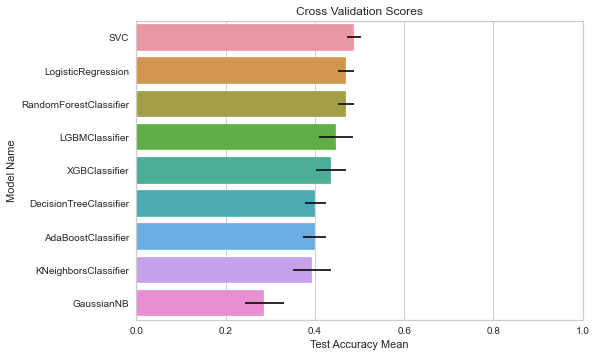

In [260]:
# Step 1: create a map containing all estimators with their default parameters
clf_list = [
    LogisticRegression(random_state = 1),
    KNeighborsClassifier(), 
    SVC(random_state = 1, probability = True),
    DecisionTreeClassifier(random_state = 1), 
    RandomForestClassifier(random_state = 1),
    XGBClassifier(random_state = 1, use_label_encoder=False),
    LGBMClassifier(),
    AdaBoostClassifier(base_estimator = DecisionTreeClassifier(random_state = 1), random_state = 1),
    GaussianNB()]

model_check(X=X_train_scaled, y= y_train, estimators= clf_list,cv=5)

In [234]:
base_estimators = [(est.__class__.__name__, est) for est in clf_list]

for voting in ['soft', 'hard']:
    
    voting_classifier = VotingClassifier(
        estimators = base_estimators ,
        voting = voting)
    
    cv_results = cross_validate(
        voting_classifier,
        X_train_scaled,
        y_train,
        cv = 5,
        scoring='accuracy',
        return_train_score=True,
        n_jobs=-1)
    
    print(f'\n\n\n\nResult for {voting} VotingClassifier_______\n')
    display(pd.DataFrame(cv_results).mean())





Result for soft VotingClassifier_______



fit_time       1.769521
score_time     0.048553
test_score     0.445161
train_score    1.000000
dtype: float64





Result for hard VotingClassifier_______



fit_time       1.721589
score_time     0.053144
test_score     0.458065
train_score    1.000000
dtype: float64

In [237]:
model_param = [
    (LogisticRegression(), {'max_iter' : [100],
                            'penalty' : ['l1', 'l2'],
                            'C' : np.logspace(-2, 2, 20),
                            'solver' : ['lbfgs', 'liblinear']}),
    (KNeighborsClassifier(), {'n_neighbors' : np.arange(3, 30, 1),
                              'weights': ['uniform', 'distance'],
                              'algorithm': ['auto'],
                              'p': [1, 2]}),
    (SVC(), [{'kernel': ['rbf'], 
              'gamma': [0.001, 0.01, 0.1, 0.5, 1, 2, 5],
              'C': [0.1, 0.5,  1, 2, 5]},
              {'kernel': ['linear'], 
              'C': [.1, 1, 2, 10]},
              {'kernel': ['poly'], 
              'degree' : [2, 3, 4, 5], 
              'C': [.1, 1, 10]}]),
    #(DecisionTreeClassifier(random_state = 1), {'max_depth': [3, 5, 10, 20, 50],
    #                                            'criterion': ['entropy', 'gini'],
    #                                            'min_samples_split': [5, 10, 15, 30],
    #                                            'max_features': ['auto', 'sqrt', 'log2']}),
    (RandomForestClassifier(random_state = 42),{'n_estimators': [50, 150, 300, 450],
                                                'criterion': ['entropy'],
                                                'bootstrap': [True],
                                                'max_depth': [3, 5, 10],
                                                'max_features': ['auto','sqrt'],
                                                'min_samples_leaf': [2, 3],
                                                'min_samples_split': [2, 3]}),
    #(XGBClassifier(random_state = 1, use_label_encoder=False,tree_method='gpu_hist', gpu_id=0),{'n_estimators': [15, 25, 50, 100],
    #                                                                                            'colsample_bytree': [0.65, 0.75, 0.80],
    #                                                                                            #'max_depth': [None],
    #                                                                                            'reg_alpha': [1],
    #                                                                                            'reg_lambda': [1, 2, 5],
    #                                                                                            'subsample': [0.50, 0.75, 1.00],
    #                                                                                            'learning_rate': [0.01, 0.1, 0.5],
    #                                                                                            'gamma': [0.5, 1, 2, 5],
    #                                                                                            'min_child_weight': [0.01],
    #                                                                                            'sampling_method': ['uniform']}),
    (LGBMClassifier(random_state=42),{#'num_leaves': sp_randint(6, 50), 
                                      #'min_child_samples': sp_randint(100, 500), 
                                      'min_child_weight': [1e-5, 1e-1, 1, 1e1, 1e2, 1e4],
                                      #'subsample': sp_uniform(loc=0.2, scale=0.8), 
                                      #'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
                                      'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50],
                                      'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 10]}),
    (AdaBoostClassifier(base_estimator = DecisionTreeClassifier(random_state = 1), random_state=1),{'algorithm': ['SAMME', 'SAMME.R'],
                                                                                                    'base_estimator__criterion' : ['gini', 'entropy'],
                                                                                                    'base_estimator__splitter' : ['best', 'random'],
                                                                                                    'n_estimators': [2, 5, 10, 50],
                                                                                                    'learning_rate': [0.01, 0.1, 0.2, 0.3, 1, 2]})]

,mean_test_score,mean_train_score,std_test_score,std_train_score,params,mean_fit_time
LogisticRegression,0.498618,0.518664,0.008447,0.005520,"{'C': 0.11288378916846889, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}",0.009379
LGBMClassifier,0.497696,0.510138,0.002915,0.008786,"{'min_child_weight': 100.0, 'reg_alpha': 10, 'reg_lambda': 20}",0.096732
RandomForestClassifier,0.497696,0.518894,0.006517,0.009710,"{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 3, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}",0.802597
SVC,0.496774,0.538249,0.004515,0.020355,"{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}",0.081997
KNeighborsClassifier,0.484793,1.000000,0.024799,0.000000,"{'algorithm': 'auto', 'n_neighbors': 25, 'p': 2, 'weights': 'distance'}",0.001399
AdaBoostClassifier,0.400000,1.000000,0.025806,0.000000,"{'algorithm': 'SAMME', 'base_estimator__criterion': 'gini', 'base_estimator__splitter': 'best', 'learning_rate': 0.01, 'n_estimators': 2}",0.025599


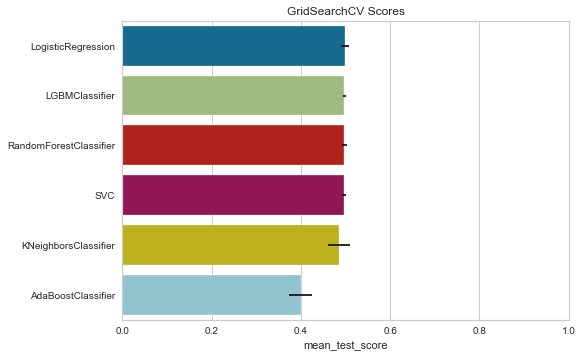

In [239]:
tuned_models= model_tuning_check(X_train_scaled, y_train, estimators= model_param)

In [245]:
model = VotingClassifier(
    estimators= [(clf.__class__.__name__, clf)  for clf in tuned_models],# if clf.__class__.__name__ not in ['AdaBoostClassifier', 'LogisticRegression']],
    voting='hard')

#model.fit(X_train_scaled, y_train)

result = cross_validate(model, 
               X_train_scaled,
               y_train,
               cv = 5,
               scoring='accuracy',
               return_train_score=True,
              n_jobs=-1)
print ('Tuned Voting classifier Models - \n-----------------------')
print (f'Accuracy => {np.round(result["test_score"].mean()*100, 2)} %')

Tuned Voting classifier Models - 
-----------------------
Accuracy => 50.14 %


#### 5.5.1.4 Avaliação

In [248]:
def plot_learning_curve(estimators,
                        X,
                        y,
                        ylim=None,
                        cv=None,
                        n_jobs=None,
                        train_sizes=np.linspace(.1, 1.0, 5)):
    
    fig, axes = plt.subplots(3, 2, figsize=(25, 35))
    axes = axes.flatten()

    for ax, estimator in zip(axes, estimators):

        ax.set_title(f'{estimator.__class__.__name__} Learning Curve')
        if ylim is not None:
            ax.set_ylim(*ylim)
        ax.set_xlabel('Training examples')
        ax.set_ylabel('Score')

        train_sizes, train_scores, test_scores, fit_times, _ = \
            learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                           train_sizes=train_sizes,
                           return_times=True)
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Plot learning curve

        ax.fill_between(train_sizes,
                        train_scores_mean - train_scores_std,
                        train_scores_mean + train_scores_std,
                        alpha=0.1,
                        color='r')
        ax.fill_between(train_sizes,
                        test_scores_mean - test_scores_std,
                        test_scores_mean + test_scores_std,
                        alpha=0.1,
                        color='g')
        ax.plot(train_sizes,
                train_scores_mean,
                'o-',
                color='r',
                label='Training score')
        ax.plot(train_sizes,
                test_scores_mean,
                'o-',
                color='g',
                label='Cross-validation score')
        ax.legend(loc='best')
        
    plt.show()

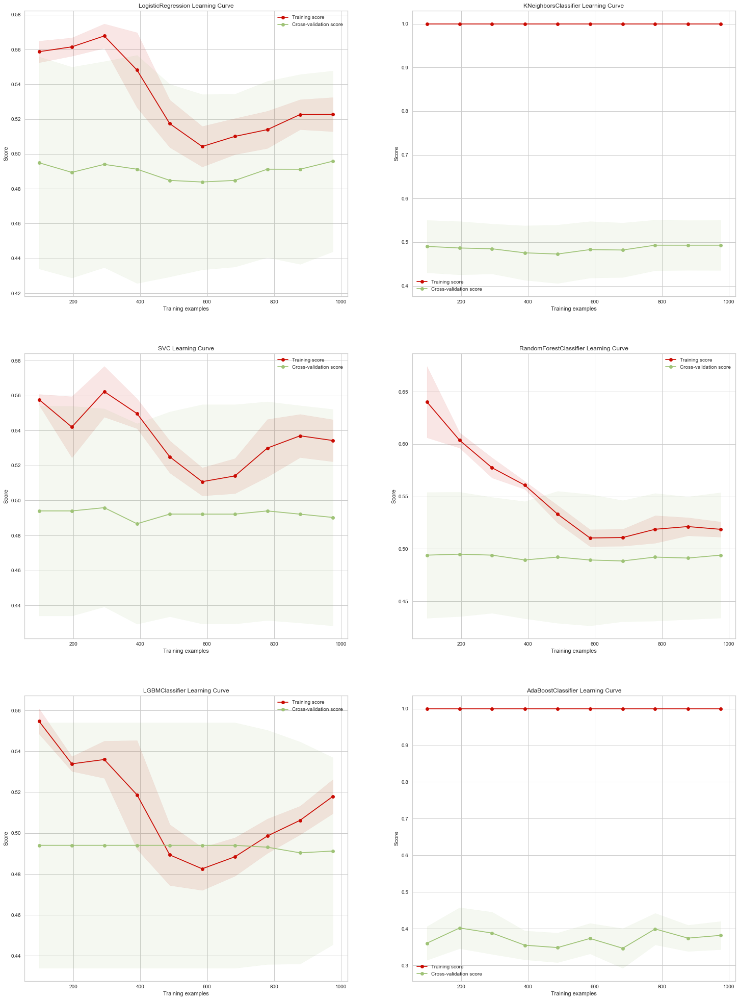

NameError: name 'all_data' is not defined

In [249]:
plot_learning_curve(tuned_models,
                    pd.DataFrame(X_train_scaled),
                    y_train,
                    ylim=None,
                    cv=KFold(10),
                    n_jobs=-1,
                    train_sizes=np.linspace(.1, 1.0, 10))


# clean up memory
del tuned_models, model, clf_list, base_estimators, train, X_train, X_test, df

,mean_test_score,mean_train_score,std_test_score,std_train_score,params,mean_fit_time
KNeighborsClassifier,0.697696,1.000000,0.023963,0.000000,"{'algorithm': 'auto', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}",0.001200
SVC,0.674654,0.962903,0.013546,0.002765,"{'C': 2, 'gamma': 0.1, 'kernel': 'rbf'}",0.106003
RandomForestClassifier,0.623963,0.885023,0.027434,0.005616,"{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}",0.407726
LGBMClassifier,0.612903,0.957373,0.038775,0.002726,"{'min_child_weight': 1e-05, 'reg_alpha': 0, 'reg_lambda': 0}",0.190626
AdaBoostClassifier,0.598157,1.000000,0.026934,0.000000,"{'algorithm': 'SAMME', 'base_estimator__criterion': 'entropy', 'base_estimator__splitter': 'best', 'learning_rate': 0.01, 'n_estimators': 2}",0.006250
LogisticRegression,0.522581,0.535945,0.048822,0.014415,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}",0.002401


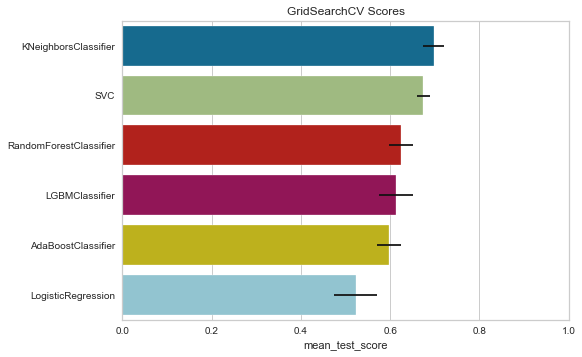

In [273]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import NeighborhoodComponentsAnalysis

# PCA 
#X_train_pca= PCA(n_components=2).fit_transform(X_train_scaled)

# LinearDiscriminantAnalysis
#X_train_pca= LinearDiscriminantAnalysis(n_components=2).fit_transform(X_train_scaled, y_train)

# NeighborhoodComponentsAnalysis
NCA = NeighborhoodComponentsAnalysis(n_components=2).fit(X_train_scaled, y_train)

X_train_pca = NCA.transform(X_train_scaled)
X_test_pca =NCA.transform(X_test_scaled)

# memory cleanup
#del NCA, X_train_scaled, X_test_scaled

# train models on X_train_pca
models_pca= model_tuning_check(X_train_pca, y_train, estimators= model_param)

### 5.5.2 Duas Categorias - Classificar em Vitória ou Empate Casa, Derrota Casa

#### 5.5.1.1 Seleção de Features

In [321]:
###
matches_1x = matches_cmp_filt_pred_modelo.reset_index().copy()
matches_1x['pontuou'] = np.nan
matches_1x.loc[matches_1x['winner']==2, 'pontuou']=1
matches_1x.loc[matches_1x['winner']==1, 'pontuou']=1
matches_1x.loc[matches_1x['winner']==0, 'pontuou']=0

matches_cmp_filt_pred_modelo['pontuou'] = matches_1x['pontuou'].values

In [323]:
# Cria novos dataframes para divisão em treino e teste, sem empates
X2 = matches_cmp_filt_pred_modelo.drop(columns = 'pontuou')
y2 = matches_cmp_filt_pred_modelo['pontuou']

X2 = X2[(features.set_index('feature').index)]

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.4, random_state= 1333, shuffle = False)

# Padronizar as características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [324]:
#SEPARACAO EM FEATURES E TARGET
X = matches_cmp_filt_pred_modelo
y = matches_cmp_filt_pred_modelo.reset_index()['winner']

In [325]:
def correlated_columns(df, threshold=0.85):
    return (
        df.corr()
        .pipe(
            lambda df1: pd.DataFrame(
                np.tril(df1, k=-1),
                columns=df.columns,
                index=df.columns,
            )
        )
    .stack()
    .rename("pearson")
    .pipe(
        lambda s: s[
            s.abs() > threshold
        ].reset_index()
    )
        .query("level_0 not in level_1")
    )

cr =correlated_columns(X)

X = X.drop(columns = cr['level_0'])

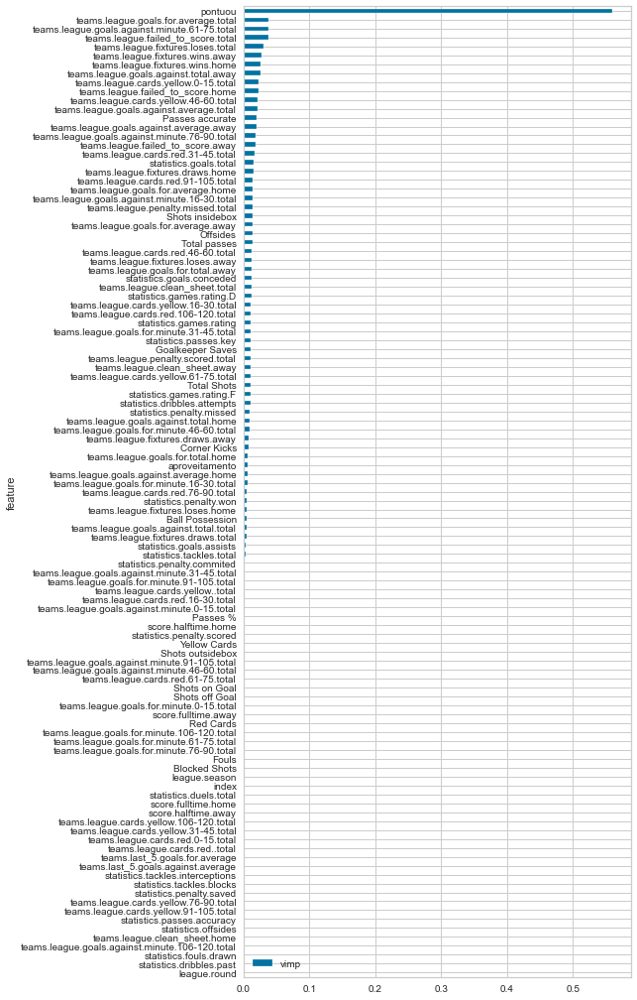

56

In [326]:
mic = feature_selection.mutual_info_classif(X, y, random_state = 42)

fig, ax = plt.subplots(figsize=(7, 18))

features = pd.DataFrame({
    'feature': X.columns,
    "vimp": mic
})

features.set_index('feature').sort_values(by = 'vimp').plot.barh(ax = ax)

plt.show()

mask = features.set_index('feature').apply(lambda x: x>0.005).reset_index()

features = features[mask.vimp]

X = X[(features.set_index('feature').index)]

X.shape[1]

In [327]:
X.tail()

,,,,,,Corner Kicks,Goalkeeper Saves,Offsides,Passes accurate,Shots insidebox,Total Shots,Total passes,aproveitamento,statistics.dribbles.attempts,statistics.games.rating,statistics.games.rating.D,statistics.games.rating.F,statistics.goals.conceded,statistics.goals.total,statistics.passes.key,statistics.penalty.missed,statistics.penalty.won,teams.league.cards.red.106-120.total,teams.league.cards.red.31-45.total,teams.league.cards.red.46-60.total,teams.league.cards.red.76-90.total,teams.league.cards.red.91-105.total,teams.league.cards.yellow.0-15.total,teams.league.cards.yellow.16-30.total,teams.league.cards.yellow.46-60.total,teams.league.cards.yellow.61-75.total,teams.league.clean_sheet.away,teams.league.clean_sheet.total,teams.league.failed_to_score.away,teams.league.failed_to_score.home,teams.league.failed_to_score.total,teams.league.fixtures.draws.away,teams.league.fixtures.draws.home,teams.league.fixtures.loses.away,teams.league.fixtures.loses.total,teams.league.fixtures.wins.away,teams.league.fixtures.wins.home,teams.league.goals.against.average.away,teams.league.goals.against.average.home,teams.league.goals.against.average.total,teams.league.goals.against.minute.16-30.total,teams.league.goals.against.minute.61-75.total,teams.league.goals.against.minute.76-90.total,teams.league.goals.against.total.away,teams.league.goals.against.total.home,teams.league.goals.for.average.away,teams.league.goals.for.average.home,teams.league.goals.for.average.total,teams.league.goals.for.minute.16-30.total,teams.league.goals.for.minute.31-45.total,teams.league.goals.for.minute.46-60.total,teams.league.goals.for.total.away,teams.league.goals.for.total.home,teams.league.penalty.missed.total,teams.league.penalty.scored.total,pontuou
fixture.id,fixture.date,teams.home.id,teams.away.id,winner,league.id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
838323,2022-10-27T22:00:00+00:00,126,144,2,71,0.0,-0.4,1.0,149.0,0.0,-0.6,150.2,0.141414,3.2,0.036083,-0.056976,0.432000,-0.2,-0.4,-0.6,0.0,0.0,0.0,0.0,0.0,2.0,1.0,-4.0,5.0,2.0,-1.0,1,4,0,-1,-1,4,1,-5,-8,2,1,-0.8,0.0,-0.4,-5.0,4.0,-3.0,-12,-2,0.2,0.7,0.4,4.0,4.0,1.0,4,9,0,3,1.0
838327,2022-10-27T22:00:00+00:00,154,147,2,71,-1.0,-1.2,0.0,-48.2,-0.2,-1.0,-34.0,0.101010,1.2,0.198595,0.339429,0.079667,-1.6,0.4,-1.2,0.0,0.0,0.0,1.0,0.0,-5.0,-2.0,-1.0,-3.0,4.0,3.0,5,6,-7,4,-3,0,4,-6,-6,7,-5,-1.1,-0.1,-0.6,-6.0,-6.0,-4.0,-17,-3,0.5,-0.4,0.0,1.0,2.0,-5.0,9,-8,0,-1,1.0
838321,2022-10-27T22:30:00+00:00,1062,152,2,71,5.4,-1.4,0.4,59.0,-1.0,-1.4,76.0,0.272727,-2.8,0.096964,0.351143,0.045667,-1.8,-0.2,-2.6,0.0,0.2,0.0,-2.0,-2.0,-2.0,-1.0,2.0,-8.0,1.0,-4.0,6,9,-2,0,-2,3,-3,-7,-9,5,4,-1.3,-0.4,-0.8,-8.0,-8.0,-1.0,-19,-8,0.4,0.4,0.4,1.0,1.0,8.0,7,5,0,1,1.0
838329,2022-10-27T23:00:00+00:00,1193,145,2,71,-1.0,-0.8,0.0,-72.0,3.8,3.4,-64.0,0.030303,-1.6,0.054107,0.014095,0.165333,-0.6,0.4,0.0,0.0,0.2,0.0,0.0,2.0,1.0,-1.0,0.0,-4.0,-3.0,-11.0,0,2,-2,3,1,0,3,-1,-3,2,-2,-0.5,-0.6,-0.6,0.0,-7.0,-4.0,-7,-11,0.3,-0.4,0.0,-1.0,-1.0,-5.0,5,-8,0,-8,1.0
838308,2022-10-29T23:30:00+00:00,151,131,1,71,-1.0,1.6,0.4,-194.4,0.0,1.2,-200.6,-0.147059,-2.0,-0.001801,-0.026167,0.053667,0.8,0.0,0.2,0.0,-0.2,0.0,-1.0,0.0,2.0,0.0,7.0,5.0,4.0,7.0,0,-6,1,-1,0,0,3,1,3,0,-6,0.1,0.5,0.3,1.0,-5.0,3.0,3,8,0.1,-0.2,-0.1,-6.0,-1.0,2.0,2,-4,0,3,1.0


#### 5.5.1.2 Divisão e Padronização

In [328]:
# 1. Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state= 42, shuffle = False)

# 2. Padronizar as características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 5.5.1.3 Treinamento e Parametrização

,Model Name,Test Accuracy Mean,Train Accuracy Mean,Test Std,Time
2,SVC,0.731797,0.805300,0.010669,0.286827
4,RandomForestClassifier,0.714286,1.000000,0.024034,0.222300
6,LGBMClassifier,0.704147,1.000000,0.035385,0.342525
0,LogisticRegression,0.701382,0.763594,0.026296,0.054570
5,XGBClassifier,0.698618,1.000000,0.025173,0.577442
8,GaussianNB,0.685714,0.718433,0.034288,0.002589
3,DecisionTreeClassifier,0.651613,1.000000,0.016894,0.015605
7,AdaBoostClassifier,0.646083,1.000000,0.011060,0.017192
1,KNeighborsClassifier,0.606452,0.742166,0.009030,0.006244


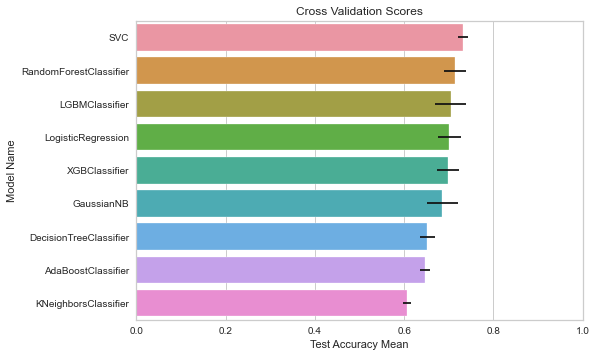

In [329]:
# Step 1: create a map containing all estimators with their default parameters
clf_list = [
    LogisticRegression(random_state = 1),
    KNeighborsClassifier(), 
    SVC(random_state = 1, probability = True),
    DecisionTreeClassifier(random_state = 1), 
    RandomForestClassifier(random_state = 1),
    XGBClassifier(random_state = 1, use_label_encoder=False),
    LGBMClassifier(),
    AdaBoostClassifier(base_estimator = DecisionTreeClassifier(random_state = 1), random_state = 1),
    GaussianNB()]

model_check(X=X_train_scaled, y= y_train, estimators= clf_list,cv=5)

In [330]:
base_estimators = [(est.__class__.__name__, est) for est in clf_list]

for voting in ['soft', 'hard']:
    
    voting_classifier = VotingClassifier(
        estimators = base_estimators ,
        voting = voting)
    
    cv_results = cross_validate(
        voting_classifier,
        X_train_scaled,
        y_train,
        cv = 5,
        scoring='accuracy',
        return_train_score=True,
        n_jobs=-1)
    
    print(f'\n\n\n\nResult for {voting} VotingClassifier_______\n')
    display(pd.DataFrame(cv_results).mean())





Result for soft VotingClassifier_______



fit_time       1.513238
score_time     0.045463
test_score     0.705991
train_score    1.000000
dtype: float64





Result for hard VotingClassifier_______



fit_time       1.505580
score_time     0.045614
test_score     0.720737
train_score    1.000000
dtype: float64

In [331]:
model_param = [
    (LogisticRegression(), {'max_iter' : [100],
                            'penalty' : ['l1', 'l2'],
                            'C' : np.logspace(-2, 2, 20),
                            'solver' : ['lbfgs', 'liblinear']}),
    (KNeighborsClassifier(), {'n_neighbors' : np.arange(3, 30, 1),
                              'weights': ['uniform', 'distance'],
                              'algorithm': ['auto'],
                              'p': [1, 2]}),
    (SVC(), [{'kernel': ['rbf'], 
              'gamma': [0.001, 0.01, 0.1, 0.5, 1, 2, 5],
              'C': [0.1, 0.5,  1, 2, 5]},
              {'kernel': ['linear'], 
              'C': [.1, 1, 2, 10]},
              {'kernel': ['poly'], 
              'degree' : [2, 3, 4, 5], 
              'C': [.1, 1, 10]}]),
    #(DecisionTreeClassifier(random_state = 1), {'max_depth': [3, 5, 10, 20, 50],
    #                                            'criterion': ['entropy', 'gini'],
    #                                            'min_samples_split': [5, 10, 15, 30],
    #                                            'max_features': ['auto', 'sqrt', 'log2']}),
    (RandomForestClassifier(random_state = 42),{'n_estimators': [50, 150, 300, 450],
                                                'criterion': ['entropy'],
                                                'bootstrap': [True],
                                                'max_depth': [3, 5, 10],
                                                'max_features': ['auto','sqrt'],
                                                'min_samples_leaf': [2, 3],
                                                'min_samples_split': [2, 3]}),
    #(XGBClassifier(random_state = 1, use_label_encoder=False,tree_method='gpu_hist', gpu_id=0),{'n_estimators': [15, 25, 50, 100],
    #                                                                                            'colsample_bytree': [0.65, 0.75, 0.80],
    #                                                                                            #'max_depth': [None],
    #                                                                                            'reg_alpha': [1],
    #                                                                                            'reg_lambda': [1, 2, 5],
    #                                                                                            'subsample': [0.50, 0.75, 1.00],
    #                                                                                            'learning_rate': [0.01, 0.1, 0.5],
    #                                                                                            'gamma': [0.5, 1, 2, 5],
    #                                                                                            'min_child_weight': [0.01],
    #                                                                                            'sampling_method': ['uniform']}),
    (LGBMClassifier(random_state=42),{#'num_leaves': sp_randint(6, 50), 
                                      #'min_child_samples': sp_randint(100, 500), 
                                      'min_child_weight': [1e-5, 1e-1, 1, 1e1, 1e2, 1e4],
                                      #'subsample': sp_uniform(loc=0.2, scale=0.8), 
                                      #'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
                                      'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50],
                                      'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 10]}),
    (AdaBoostClassifier(base_estimator = DecisionTreeClassifier(random_state = 1), random_state=1),{'algorithm': ['SAMME', 'SAMME.R'],
                                                                                                    'base_estimator__criterion' : ['gini', 'entropy'],
                                                                                                    'base_estimator__splitter' : ['best', 'random'],
                                                                                                    'n_estimators': [2, 5, 10, 50],
                                                                                                    'learning_rate': [0.01, 0.1, 0.2, 0.3, 1, 2]})]

,mean_test_score,mean_train_score,std_test_score,std_train_score,params,mean_fit_time
LogisticRegression,0.736406,0.737788,0.006114,0.001563,"{'C': 0.06951927961775606, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}",0.006541
SVC,0.736406,0.736406,0.001843,0.000461,"{'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}",0.104584
LGBMClassifier,0.736406,0.736406,0.001843,0.000461,"{'min_child_weight': 1e-05, 'reg_alpha': 50, 'reg_lambda': 0}",0.087187
RandomForestClassifier,0.732719,0.955300,0.010509,0.011344,"{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}",0.202885
AdaBoostClassifier,0.680184,1.000000,0.019023,0.000000,"{'algorithm': 'SAMME', 'base_estimator__criterion': 'entropy', 'base_estimator__splitter': 'random', 'learning_rate': 0.01, 'n_estimators': 2}",0.014982
KNeighborsClassifier,0.660829,0.699770,0.022311,0.017707,"{'algorithm': 'auto', 'n_neighbors': 16, 'p': 2, 'weights': 'uniform'}",0.000796


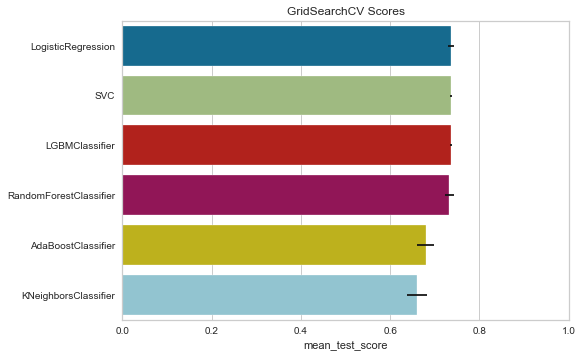

In [332]:
tuned_models = model_tuning_check(X_train_scaled, y_train, estimators= model_param)

In [333]:
model = VotingClassifier(
    estimators= [(clf.__class__.__name__, clf)  for clf in tuned_models],# if clf.__class__.__name__ not in ['AdaBoostClassifier', 'LogisticRegression']],
    voting='hard')

#model.fit(X_train_scaled, y_train)

result = cross_validate(model, 
               X_train_scaled,
               y_train,
               cv = 5,
               scoring='accuracy',
               return_train_score=True,
              n_jobs=-1)
print ('Tuned Voting classifier Models - \n-----------------------')
print (f'Accuracy => {np.round(result["test_score"].mean()*100, 2)} %')

Tuned Voting classifier Models - 
-----------------------
Accuracy => 73.92 %


#### 5.5.1.4 Avaliação

### 5.5.3 Duas Categorias - Classificar em +X Gols, -X Gols

# 6. Transferências

# 7. Prêmios (Jogadores)

# 8. Top (Red-Yellowcards, Scorers, Assisters)

# 9. Afastamento e Lesões

# 10. Estádios